Notebook for us to start working in. 

# PPOL 5203 Final Project

## 1. Import Data and Clean Columns

In [2]:
#!pip install openpyxl

In [3]:
import pandas as pd
import os
import openpyxl

In [4]:
pwd

'/Users/katharynloweth/Desktop/Data_Science_I_Fall2023/PPOL5203_FinalProject/Python_code'

In [5]:
#changing path so that we can open files from the orig_data folder
#KL: when i re-run code i keep getting errors when we start to switch directories. Can we work from the main 
#final project folder and code the file paths from there?



os.chdir("../")
#os.chdir('Datasets/Orig_Data')
#os.chdir('PPOL5203_FinalProject')

In [6]:
# import County Health Data

countyhealthcols_1 = ['FIPS', 'State', 'County', 'Life Expectancy', 'Age-Adjusted Death Rate', '% Frequent Physical Distress', '% Frequent Mental Distress', 
                 'Population','% Less than 18 Years of Age','% 65 and Over','% American Indian or Alaska Native','% Asian','% Native Hawaiian or Other Pacific Islander','% Hispanic','% Non-Hispanic White','% Not Proficient in English','% Female','% Rural']

#KL : do we want to group all non-white demographic groups together as "nonwhite"?

County_Health_xl = pd.read_excel("Datasets/Orig_Data/2023_County_Health_Rankings_Data.xlsx", sheet_name = ['Additional Measure Data'],skiprows = 1, usecols = countyhealthcols_1)

#'% Non-Hispanic Black' couldn't find this one to add as a column

In [7]:
# subset the dictionary provided by the sheet needed and save as a new dataframe
County_Health_Addl_Measures = County_Health_xl['Additional Measure Data']

In [8]:
County_Health_Addl_Measures.rename(columns=lambda x: x.replace(" ", "_").replace("%", "Percent"), inplace=True)

In [9]:
County_Health_Addl_Measures.head()

,FIPS,State,County,Life_Expectancy,Age-Adjusted_Death_Rate,Percent_Frequent_Physical_Distress,Percent_Frequent_Mental_Distress,Population,Percent_Less_than_18_Years_of_Age,Percent_65_and_Over,Percent_American_Indian_or_Alaska_Native,Percent_Asian,Percent_Native_Hawaiian_or_Other_Pacific_Islander,Percent_Hispanic,Percent_Non-Hispanic_White,Percent_Not_Proficient_in_English,Percent_Female,Percent_Rural
0,1000,Alabama,NaN,74.835949,499.868550,11.077397,16.484296,5039877,22.267448,17.635688,0.714442,1.550435,0.108832,4.785196,64.877099,1.027596,51.425422,40.963183
1,1001,Alabama,Autauga,76.585650,427.073326,10.700000,16.200000,59095,23.406380,16.048735,0.458584,1.203147,0.118453,3.326847,72.454522,0.231241,51.378289,42.002162
2,1003,Alabama,Baldwin,77.724729,381.702031,9.900000,16.100000,239294,21.218250,21.469824,0.800271,1.122469,0.068535,4.841743,83.148763,0.759661,51.347715,42.279099
3,1005,Alabama,Barbour,72.867210,589.566095,14.900000,18.000000,24964,20.549591,19.976767,0.725044,0.460663,0.232335,4.959141,45.305240,1.382681,46.703253,67.789635
4,1007,Alabama,Bibb,73.609363,567.508146,12.700000,17.400000,22477,20.118343,16.737109,0.502736,0.275838,0.129021,3.087601,73.564088,0.443062,46.015927,68.352607


In [10]:
countyhealthcols_2 = ['FIPS','% Fair or Poor Health', 'Average Number of Physically Unhealthy Days', 'Average Number of Mentally Unhealthy Days', '# Primary Care Physicians','Primary Care Physicians Rate',
                 'Primary Care Physicians Ratio', '# Dentists', 'Dentist Rate','Dentist Ratio', 'Average Daily PM2.5', 'Presence of Water Violation', '# Mental Health Providers','Mental Health Provider Rate','Mental Health Provider Ratio']

County_Health_xl_ranked_data = pd.read_excel("Datasets/Orig_Data/2023_County_Health_Rankings_Data.xlsx", sheet_name = ['Ranked Measure Data'],skiprows = 1, usecols = countyhealthcols_2)




In [11]:
# subset the dictionary provided by the sheet needed and save as a new dataframe
County_Health_Ranked_Measures = County_Health_xl_ranked_data['Ranked Measure Data']

In [12]:
# clean column names
County_Health_Ranked_Measures.rename(columns=lambda x: x.replace(" ", "_").replace("%", "Percent").replace("#", "Number"), inplace=True)

# Do we want to convert percents to decimals?
# Do we want the ratios for dentist, primary care, mental health? 

In [13]:
County_Health_Ranked_Measures.head()

,FIPS,Percent_Fair_or_Poor_Health,Average_Number_of_Physically_Unhealthy_Days,Average_Number_of_Mentally_Unhealthy_Days,Number_Primary_Care_Physicians,Primary_Care_Physicians_Rate,Primary_Care_Physicians_Ratio,Number_Dentists,Dentist_Rate,Dentist_Ratio,Number_Mental_Health_Providers,Mental_Health_Provider_Rate,Mental_Health_Provider_Ratio,Average_Daily_PM2.5,Presence_of_Water_Violation
0,1000,18.9,3.482416,5.073277,3238.0,65.79252,1520:1,2454.0,48.69166,2054:1,6321.0,125.41973,797:1,9.3,NaN
1,1001,16.9,3.432211,4.797351,25.0,44.52756,2246:1,19.0,32.15162,3110:1,21.0,35.53600,2814:1,10.0,No
2,1003,14.9,3.276177,4.753750,150.0,65.42019,1529:1,114.0,47.64014,2099:1,250.0,104.47399,957:1,7.6,Yes
3,1005,27.5,4.605432,4.954855,8.0,32.53487,3074:1,8.0,32.04615,3121:1,6.0,24.03461,4161:1,9.4,Yes
4,1007,21.6,4.012182,5.364779,14.0,63.24539,1581:1,6.0,26.69395,3746:1,9.0,40.04093,2497:1,9.8,No


In [14]:
#import NRI data 

NRIcols = ['STATE', 'STATEABBRV', 'COUNTY','STCOFIPS', 'POPULATION','AREA',
           'RISK_SCORE','RISK_RATNG','EAL_SCORE','EAL_RATNG','SOVI_SCORE','SOVI_RATNG','RESL_SCORE','RESL_RATNG']

NRI_df = pd.read_csv("Datasets/Orig_Data/NRI_Table_Counties/NRI_Table_Counties.csv", usecols = NRIcols)

In [15]:
NRI_df.rename(columns = {'STCOFIPS': 'FIPS'}, inplace = True)

In [16]:
NRI_df.head()

,STATE,STATEABBRV,COUNTY,FIPS,POPULATION,AREA,RISK_SCORE,RISK_RATNG,EAL_SCORE,EAL_RATNG,SOVI_SCORE,SOVI_RATNG,RESL_SCORE,RESL_RATNG
0,Alabama,AL,Autauga,1001,58764,610.470508,49.220490,Relatively Low,50.943980,Very Low,51.299999,Relatively Moderate,51.810001,Relatively Moderate
1,Alabama,AL,Baldwin,1003,231365,2047.738775,97.709195,Relatively High,98.235840,Relatively High,31.030001,Relatively Low,86.120003,Very High
2,Alabama,AL,Barbour,1005,25160,913.646511,56.188355,Relatively Low,44.877747,Very Low,99.269997,Very High,6.240000,Very Low
3,Alabama,AL,Bibb,1007,22239,632.486798,32.484887,Very Low,30.485918,Very Low,80.779999,Very High,19.730000,Very Low
4,Alabama,AL,Blount,1009,58992,657.196555,65.128858,Relatively Low,63.633550,Relatively Low,51.369999,Relatively Moderate,22.820000,Relatively Low


In [17]:
#os.chdir('../')


In [18]:
pwd


'/Users/katharynloweth/Desktop/Data_Science_I_Fall2023/PPOL5203_FinalProject'

In [19]:
#import Places data 

PlacesCols = ['StateAbbr', 'StateDesc', 'LocationName', 'LocationID', 'Geolocation']


Places_df = pd.read_csv("Datasets/Orig_Data/PLACES__Local_Data_for_Better_Health__County_Data_2023_release.csv", usecols = PlacesCols)


In [20]:
#I moved this code later on so that it is in the final dataset
#Places_df['County_State'] = Places_df.LocationName + ", " + Places_df.StateAbbr

In [21]:
Places_df.head()

,StateAbbr,StateDesc,LocationName,LocationID,Geolocation
0,GA,Georgia,Ware,13299,POINT (-82.4215072 31.050881)
1,IN,Indiana,Ohio,18115,POINT (-84.9642994 38.940527)
2,IN,Indiana,Owen,18119,POINT (-86.8388453 39.3173394)
3,IA,Iowa,Iowa,19095,POINT (-92.0591226 41.6839184)
4,IA,Iowa,Marion,19125,POINT (-93.0938678 41.3314327)


In [22]:
# Create a new column for the county and state so that we can merge later
# Confirm - this data set does not include FIPS?
#KL -changing group to group by the FIPS (in this case called LocationID)
Places_df_grouped = pd.DataFrame(Places_df.groupby('LocationID', as_index = False)['Geolocation'].first())
Places_df_grouped.head()

,LocationID,Geolocation
0,59,None
1,1001,POINT (-86.6464395 32.5322367)
2,1003,POINT (-87.7460666 30.6592183)
3,1005,POINT (-85.4051035 31.8702531)
4,1007,POINT (-87.1271475 33.0158929)


## 2. Merge Datasets together by FIPS

In [23]:
# To see which data set has the most information on FIPS

print( NRI_df.shape)
print( County_Health_Ranked_Measures.shape)
print( County_Health_Addl_Measures.shape)
print( Places_df_grouped.shape)

(3231, 14)
(3193, 15)
(3193, 18)
(3144, 2)


In [24]:
# Do we want to join on the left or outer? Outer would mean that we don't have data for NRI for those FIPS that are coming from the county health data

Merged_County_Data_Ranked = pd.merge(NRI_df, County_Health_Ranked_Measures, how = 'left', on = 'FIPS')

In [25]:
Merged_County_Data_Ranked.shape

(3231, 28)

In [26]:
Merged_County_Data_Ranked.head()

,STATE,STATEABBRV,COUNTY,FIPS,POPULATION,AREA,RISK_SCORE,RISK_RATNG,EAL_SCORE,EAL_RATNG,...,Primary_Care_Physicians_Rate,Primary_Care_Physicians_Ratio,Number_Dentists,Dentist_Rate,Dentist_Ratio,Number_Mental_Health_Providers,Mental_Health_Provider_Rate,Mental_Health_Provider_Ratio,Average_Daily_PM2.5,Presence_of_Water_Violation
0,Alabama,AL,Autauga,1001,58764,610.470508,49.220490,Relatively Low,50.943980,Very Low,...,44.52756,2246:1,19.0,32.15162,3110:1,21.0,35.53600,2814:1,10.0,No
1,Alabama,AL,Baldwin,1003,231365,2047.738775,97.709195,Relatively High,98.235840,Relatively High,...,65.42019,1529:1,114.0,47.64014,2099:1,250.0,104.47399,957:1,7.6,Yes
2,Alabama,AL,Barbour,1005,25160,913.646511,56.188355,Relatively Low,44.877747,Very Low,...,32.53487,3074:1,8.0,32.04615,3121:1,6.0,24.03461,4161:1,9.4,Yes
3,Alabama,AL,Bibb,1007,22239,632.486798,32.484887,Very Low,30.485918,Very Low,...,63.24539,1581:1,6.0,26.69395,3746:1,9.0,40.04093,2497:1,9.8,No
4,Alabama,AL,Blount,1009,58992,657.196555,65.128858,Relatively Low,63.633550,Relatively Low,...,20.73291,4823:1,10.0,16.93738,5904:1,12.0,20.32486,4920:1,9.6,No


In [27]:
Merged_County_Data2 = pd.merge(NRI_df, County_Health_Ranked_Measures, how = 'outer', on = 'FIPS')
Merged_County_Data2.shape

(3283, 28)

In [28]:
# going with the left join for now

#merge the additional measures with the previously merged data set
Merged_County_Data_Addl_Measures = pd.merge(Merged_County_Data_Ranked, County_Health_Addl_Measures, how = 'left', on = 'FIPS')
Merged_County_Data_Addl_Measures.shape

(3231, 45)

In [29]:
Merged_County_Data = pd.merge(Merged_County_Data_Addl_Measures,
         Places_df_grouped,
         how="outer",
         left_on = "FIPS",  
         right_on="LocationID")

Merged_County_Data.head()

#print(Merged_County_Data.shape)

,STATE,STATEABBRV,COUNTY,FIPS,POPULATION,AREA,RISK_SCORE,RISK_RATNG,EAL_SCORE,EAL_RATNG,...,Percent_American_Indian_or_Alaska_Native,Percent_Asian,Percent_Native_Hawaiian_or_Other_Pacific_Islander,Percent_Hispanic,Percent_Non-Hispanic_White,Percent_Not_Proficient_in_English,Percent_Female,Percent_Rural,LocationID,Geolocation
0,Alabama,AL,Autauga,1001.0,58764.0,610.470508,49.220490,Relatively Low,50.943980,Very Low,...,0.458584,1.203147,0.118453,3.326847,72.454522,0.231241,51.378289,42.002162,1001.0,POINT (-86.6464395 32.5322367)
1,Alabama,AL,Baldwin,1003.0,231365.0,2047.738775,97.709195,Relatively High,98.235840,Relatively High,...,0.800271,1.122469,0.068535,4.841743,83.148763,0.759661,51.347715,42.279099,1003.0,POINT (-87.7460666 30.6592183)
2,Alabama,AL,Barbour,1005.0,25160.0,913.646511,56.188355,Relatively Low,44.877747,Very Low,...,0.725044,0.460663,0.232335,4.959141,45.305240,1.382681,46.703253,67.789635,1005.0,POINT (-85.4051035 31.8702531)
3,Alabama,AL,Bibb,1007.0,22239.0,632.486798,32.484887,Very Low,30.485918,Very Low,...,0.502736,0.275838,0.129021,3.087601,73.564088,0.443062,46.015927,68.352607,1007.0,POINT (-87.1271475 33.0158929)
4,Alabama,AL,Blount,1009.0,58992.0,657.196555,65.128858,Relatively Low,63.633550,Relatively Low,...,0.660558,0.403110,0.123643,9.867719,86.329839,1.726907,50.192239,89.951502,1009.0,POINT (-86.56644 33.9773575)


In [30]:
# create new column for County_State so that we can merge with the Places data set
#Merged_County_Data_Addl_Measures['County_State'] = Merged_County_Data_Addl_Measures['COUNTY'] + ", " + Merged_County_Data_Addl_Measures['STATEABBRV']

In [31]:
# merge the places data set with the rest of the data on the County_state variable
#Merged_County_Data = pd.merge(Merged_County_Data_Addl_Measures, Places_df_grouped, how = 'left', on = 'County_State')

In [32]:
Merged_County_Data['County_State'] = Merged_County_Data.COUNTY + ", " + Merged_County_Data.STATEABBRV

Merged_County_Data.head()

,STATE,STATEABBRV,COUNTY,FIPS,POPULATION,AREA,RISK_SCORE,RISK_RATNG,EAL_SCORE,EAL_RATNG,...,Percent_Asian,Percent_Native_Hawaiian_or_Other_Pacific_Islander,Percent_Hispanic,Percent_Non-Hispanic_White,Percent_Not_Proficient_in_English,Percent_Female,Percent_Rural,LocationID,Geolocation,County_State
0,Alabama,AL,Autauga,1001.0,58764.0,610.470508,49.220490,Relatively Low,50.943980,Very Low,...,1.203147,0.118453,3.326847,72.454522,0.231241,51.378289,42.002162,1001.0,POINT (-86.6464395 32.5322367),"Autauga, AL"
1,Alabama,AL,Baldwin,1003.0,231365.0,2047.738775,97.709195,Relatively High,98.235840,Relatively High,...,1.122469,0.068535,4.841743,83.148763,0.759661,51.347715,42.279099,1003.0,POINT (-87.7460666 30.6592183),"Baldwin, AL"
2,Alabama,AL,Barbour,1005.0,25160.0,913.646511,56.188355,Relatively Low,44.877747,Very Low,...,0.460663,0.232335,4.959141,45.305240,1.382681,46.703253,67.789635,1005.0,POINT (-85.4051035 31.8702531),"Barbour, AL"
3,Alabama,AL,Bibb,1007.0,22239.0,632.486798,32.484887,Very Low,30.485918,Very Low,...,0.275838,0.129021,3.087601,73.564088,0.443062,46.015927,68.352607,1007.0,POINT (-87.1271475 33.0158929),"Bibb, AL"
4,Alabama,AL,Blount,1009.0,58992.0,657.196555,65.128858,Relatively Low,63.633550,Relatively Low,...,0.403110,0.123643,9.867719,86.329839,1.726907,50.192239,89.951502,1009.0,POINT (-86.56644 33.9773575),"Blount, AL"


In [33]:
Merged_County_Data.COUNTY.isna().value_counts()

Merged_County_Data[Merged_County_Data.COUNTY.isna()]

,STATE,STATEABBRV,COUNTY,FIPS,POPULATION,AREA,RISK_SCORE,RISK_RATNG,EAL_SCORE,EAL_RATNG,...,Percent_Asian,Percent_Native_Hawaiian_or_Other_Pacific_Islander,Percent_Hispanic,Percent_Non-Hispanic_White,Percent_Not_Proficient_in_English,Percent_Female,Percent_Rural,LocationID,Geolocation,County_State
3231,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59.0,None,NaN


In [34]:
Merged_County_Data.STATE.isna().value_counts()

STATE
False    3231
True        1
Name: count, dtype: int64

In [35]:
Merged_County_Data[Merged_County_Data.STATEABBRV == "AL"]

,STATE,STATEABBRV,COUNTY,FIPS,POPULATION,AREA,RISK_SCORE,RISK_RATNG,EAL_SCORE,EAL_RATNG,...,Percent_Asian,Percent_Native_Hawaiian_or_Other_Pacific_Islander,Percent_Hispanic,Percent_Non-Hispanic_White,Percent_Not_Proficient_in_English,Percent_Female,Percent_Rural,LocationID,Geolocation,County_State
0,Alabama,AL,Autauga,1001.0,58764.0,610.470508,49.220490,Relatively Low,50.943980,Very Low,...,1.203147,0.118453,3.326847,72.454522,0.231241,51.378289,42.002162,1001.0,POINT (-86.6464395 32.5322367),"Autauga, AL"
1,Alabama,AL,Baldwin,1003.0,231365.0,2047.738775,97.709195,Relatively High,98.235840,Relatively High,...,1.122469,0.068535,4.841743,83.148763,0.759661,51.347715,42.279099,1003.0,POINT (-87.7460666 30.6592183),"Baldwin, AL"
2,Alabama,AL,Barbour,1005.0,25160.0,913.646511,56.188355,Relatively Low,44.877747,Very Low,...,0.460663,0.232335,4.959141,45.305240,1.382681,46.703253,67.789635,1005.0,POINT (-85.4051035 31.8702531),"Barbour, AL"
3,Alabama,AL,Bibb,1007.0,22239.0,632.486798,32.484887,Very Low,30.485918,Very Low,...,0.275838,0.129021,3.087601,73.564088,0.443062,46.015927,68.352607,1007.0,POINT (-87.1271475 33.0158929),"Bibb, AL"
4,Alabama,AL,Blount,1009.0,58992.0,657.196555,65.128858,Relatively Low,63.633550,Relatively Low,...,0.403110,0.123643,9.867719,86.329839,1.726907,50.192239,89.951502,1009.0,POINT (-86.56644 33.9773575),"Blount, AL"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62,Alabama,AL,Tuscaloosa,1125.0,226701.0,1364.876560,87.114222,Relatively Moderate,87.310430,Relatively Moderate,...,1.675279,0.068720,4.179607,60.042201,0.867742,51.782104,25.508076,1125.0,POINT (-87.5227834 33.2902197),"Tuscaloosa, AL"
63,Alabama,AL,Walker,1127.0,65276.0,813.321874,73.337576,Relatively Low,69.142680,Relatively Low,...,0.518375,0.106452,2.951341,88.459996,0.500041,51.005893,74.088000,1127.0,POINT (-87.3010936 33.7915581),"Walker, AL"
64,Alabama,AL,Washington,1129.0,15333.0,1099.555462,58.001909,Relatively Low,56.453110,Relatively Low,...,0.825246,0.138641,1.736317,65.286855,0.013559,51.033208,100.000000,1129.0,POINT (-88.2124041 31.4085035),"Washington, AL"
65,Alabama,AL,Wilcox,1131.0,10548.0,916.551772,23.003500,Very Low,16.836893,Very Low,...,0.268045,0.019146,1.541260,27.177867,0.319872,52.919778,100.000000,1131.0,POINT (-87.3049349 31.9900824),"Wilcox, AL"


In [36]:
# Remove duplicate state and county columns
Merged_County_Data.drop(columns = ['LocationID', 'COUNTY', 'STATE'], inplace = True)

Merged_County_Data.head()

,STATEABBRV,FIPS,POPULATION,AREA,RISK_SCORE,RISK_RATNG,EAL_SCORE,EAL_RATNG,SOVI_SCORE,SOVI_RATNG,...,Percent_American_Indian_or_Alaska_Native,Percent_Asian,Percent_Native_Hawaiian_or_Other_Pacific_Islander,Percent_Hispanic,Percent_Non-Hispanic_White,Percent_Not_Proficient_in_English,Percent_Female,Percent_Rural,Geolocation,County_State
0,AL,1001.0,58764.0,610.470508,49.220490,Relatively Low,50.943980,Very Low,51.299999,Relatively Moderate,...,0.458584,1.203147,0.118453,3.326847,72.454522,0.231241,51.378289,42.002162,POINT (-86.6464395 32.5322367),"Autauga, AL"
1,AL,1003.0,231365.0,2047.738775,97.709195,Relatively High,98.235840,Relatively High,31.030001,Relatively Low,...,0.800271,1.122469,0.068535,4.841743,83.148763,0.759661,51.347715,42.279099,POINT (-87.7460666 30.6592183),"Baldwin, AL"
2,AL,1005.0,25160.0,913.646511,56.188355,Relatively Low,44.877747,Very Low,99.269997,Very High,...,0.725044,0.460663,0.232335,4.959141,45.305240,1.382681,46.703253,67.789635,POINT (-85.4051035 31.8702531),"Barbour, AL"
3,AL,1007.0,22239.0,632.486798,32.484887,Very Low,30.485918,Very Low,80.779999,Very High,...,0.502736,0.275838,0.129021,3.087601,73.564088,0.443062,46.015927,68.352607,POINT (-87.1271475 33.0158929),"Bibb, AL"
4,AL,1009.0,58992.0,657.196555,65.128858,Relatively Low,63.633550,Relatively Low,51.369999,Relatively Moderate,...,0.660558,0.403110,0.123643,9.867719,86.329839,1.726907,50.192239,89.951502,POINT (-86.56644 33.9773575),"Blount, AL"


In [37]:
# create function to classify community type by population of county
# these thresholds come from the CDC urban rural classification report.

def community_type_classification(population):
    '''
    Add description here.
    '''
    if population < 50000:
        return("Rural")
    elif population < 1000000:
        return("Small/Medium Urban")
    else:
        return("Urban")

In [38]:
# create new column to get community type from the created classification function
Merged_County_Data['Community_Type'] = [community_type_classification(x) for x in Merged_County_Data['POPULATION']]

In [39]:
Merged_County_Data.Community_Type.value_counts()

# Looks like we don't have many urban observations - do we want to include medium in the urban classification?

#KL - if we do cutoff for urban as greater than 250,000 its roughly 250 for urban and 700 for small urban

Community_Type
Rural                 2227
Small/Medium Urban     955
Urban                   50
Name: count, dtype: int64

In [40]:
# Look at the number of NA geolocation rows
Merged_County_Data.Geolocation.isna().value_counts() #only 89 values that don't have geolocations - could be misspellings that we need to look at?

#KL - those with NaN's in the geolocation are US territories -- we can probably remove from the dataset as there is also little information about them in the NRI
Merged_County_Data[Merged_County_Data.Geolocation.isna()]


#removing NaNs for geolocation
Merged_County_Data_clean = Merged_County_Data[Merged_County_Data.Geolocation.isna() == False]

Merged_County_Data_clean.Geolocation.isna().value_counts()


Geolocation
False    3143
Name: count, dtype: int64

In [41]:
#confirming that all of the remaining datasets have information on NRI risk 
Merged_County_Data_clean.RISK_RATNG.value_counts()

RISK_RATNG
Very Low               1511
Relatively Low         1091
Relatively Moderate     397
Relatively High         129
Very High                15
Name: count, dtype: int64

In [42]:
# Final data set merged all data sets
Merged_County_Data.columns

Index(['STATEABBRV', 'FIPS', 'POPULATION', 'AREA', 'RISK_SCORE', 'RISK_RATNG',
       'EAL_SCORE', 'EAL_RATNG', 'SOVI_SCORE', 'SOVI_RATNG', 'RESL_SCORE',
       'RESL_RATNG', 'Percent_Fair_or_Poor_Health',
       'Average_Number_of_Physically_Unhealthy_Days',
       'Average_Number_of_Mentally_Unhealthy_Days',
       'Number_Primary_Care_Physicians', 'Primary_Care_Physicians_Rate',
       'Primary_Care_Physicians_Ratio', 'Number_Dentists', 'Dentist_Rate',
       'Dentist_Ratio', 'Number_Mental_Health_Providers',
       'Mental_Health_Provider_Rate', 'Mental_Health_Provider_Ratio',
       'Average_Daily_PM2.5', 'Presence_of_Water_Violation', 'State', 'County',
       'Life_Expectancy', 'Age-Adjusted_Death_Rate',
       'Percent_Frequent_Physical_Distress',
       'Percent_Frequent_Mental_Distress', 'Population',
       'Percent_Less_than_18_Years_of_Age', 'Percent_65_and_Over',
       'Percent_American_Indian_or_Alaska_Native', 'Percent_Asian',
       'Percent_Native_Hawaiian_or_Other_P

## 3. Exploratory Scatterplots

In [43]:
import numpy as np
from plotnine import * # to imitate ggplot
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.pyplot import figure

/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 91 rows containing missing values.


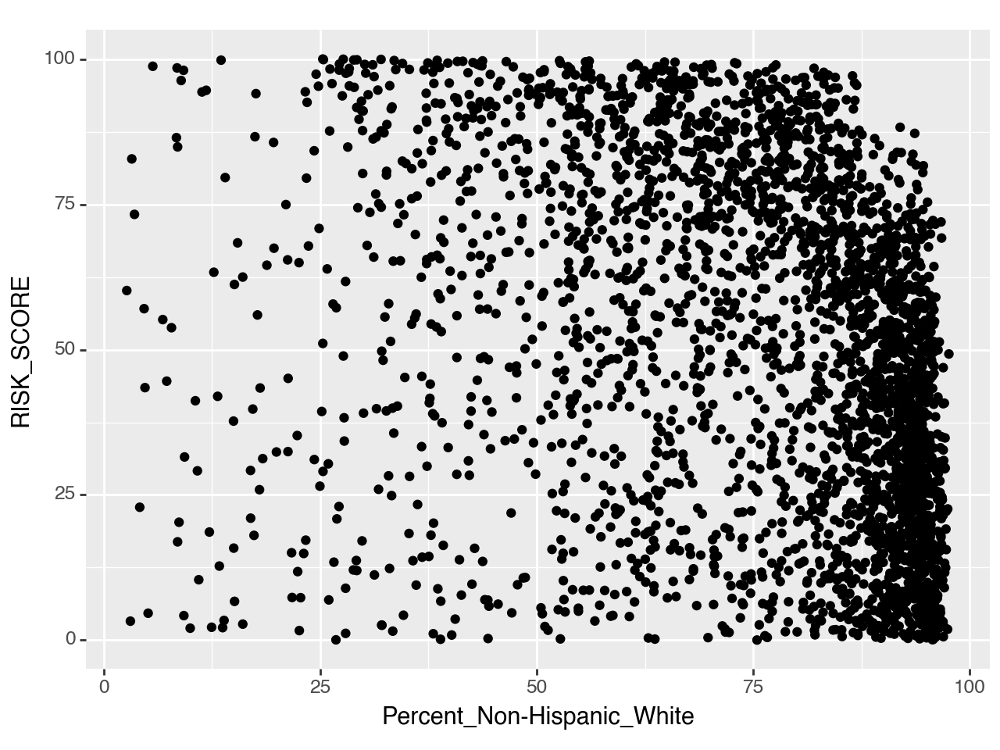

In [44]:
plot1 = (ggplot(Merged_County_Data) 
 + aes(x= "Percent_Non-Hispanic_White", y= "RISK_SCORE") 
 + geom_point())

print(plot1)

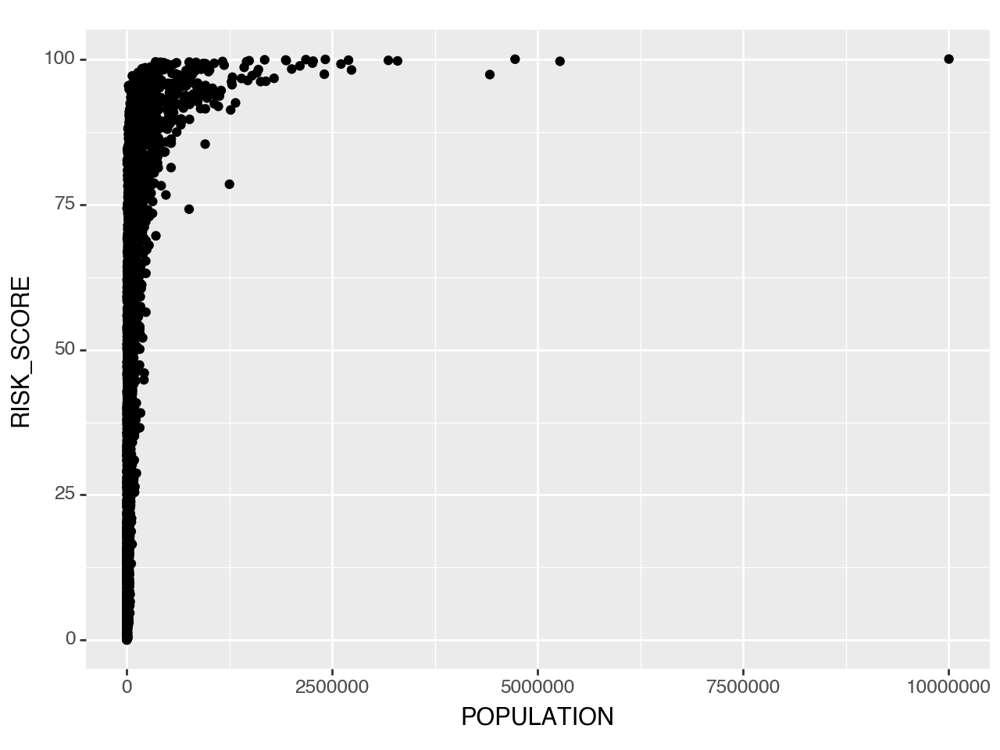

In [45]:
plot2 = (ggplot(Merged_County_Data_clean) 
 + aes(x= "POPULATION", y= "RISK_SCORE") 
 + geom_point())

print(plot2)

In [46]:
#KL - woah these are big counties
Merged_County_Data.sort_values("POPULATION", ascending = False).head(5)

,STATEABBRV,FIPS,POPULATION,AREA,RISK_SCORE,RISK_RATNG,EAL_SCORE,EAL_RATNG,SOVI_SCORE,SOVI_RATNG,...,Percent_Asian,Percent_Native_Hawaiian_or_Other_Pacific_Islander,Percent_Hispanic,Percent_Non-Hispanic_White,Percent_Not_Proficient_in_English,Percent_Female,Percent_Rural,Geolocation,County_State,Community_Type
205,CA,6037.0,10005712.0,4797.383550,100.000000,Very High,100.000000,Very High,85.839996,Very High,...,15.646870,0.368308,49.086601,25.311988,12.545321,50.447325,0.605218,POINT (-118.2618616 34.1963983),"Los Angeles, CA",Urban
611,IL,17031.0,5272775.0,1651.135984,99.618199,Very High,99.597648,Very High,80.040001,Very High,...,8.089507,0.071330,26.030272,41.471225,6.509240,51.174508,0.045296,POINT (-87.6454546 41.8942937),"Cook, IL",Urban
2624,TX,48201.0,4726200.0,1795.344568,99.968183,Very High,99.969050,Very High,89.529999,Very High,...,7.417889,0.116560,44.365243,27.671969,11.089660,50.208247,1.213280,POINT (-95.3930371 29.857273),"Harris, TX",Urban
104,AZ,4013.0,4418836.0,9319.141753,97.327394,Relatively High,97.647787,Relatively High,73.970001,Relatively High,...,4.804665,0.298426,31.950915,53.423440,4.335683,50.295113,2.363800,POINT (-112.4989296 33.3451756),"Maricopa, AZ",Urban
223,CA,6073.0,3295981.0,4571.491190,99.681833,Very High,99.690498,Very High,69.889999,Relatively High,...,12.899607,0.603031,34.849633,43.750512,6.150668,49.332713,3.297049,POINT (-116.7761174 33.0236041),"San Diego, CA",Urban


/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 161 rows containing missing values.


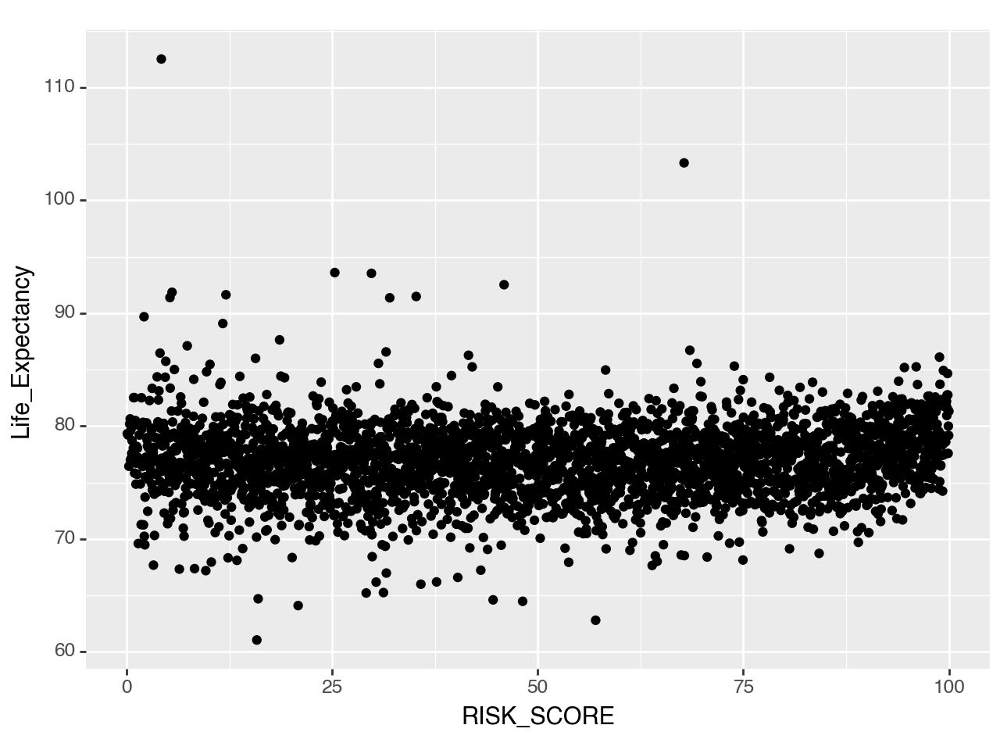

In [47]:
plot3 = (ggplot(Merged_County_Data) 
 + aes(x= "RISK_SCORE", y="Life_Expectancy") 
 + geom_point())

print(plot3)

/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 92 rows containing missing values.


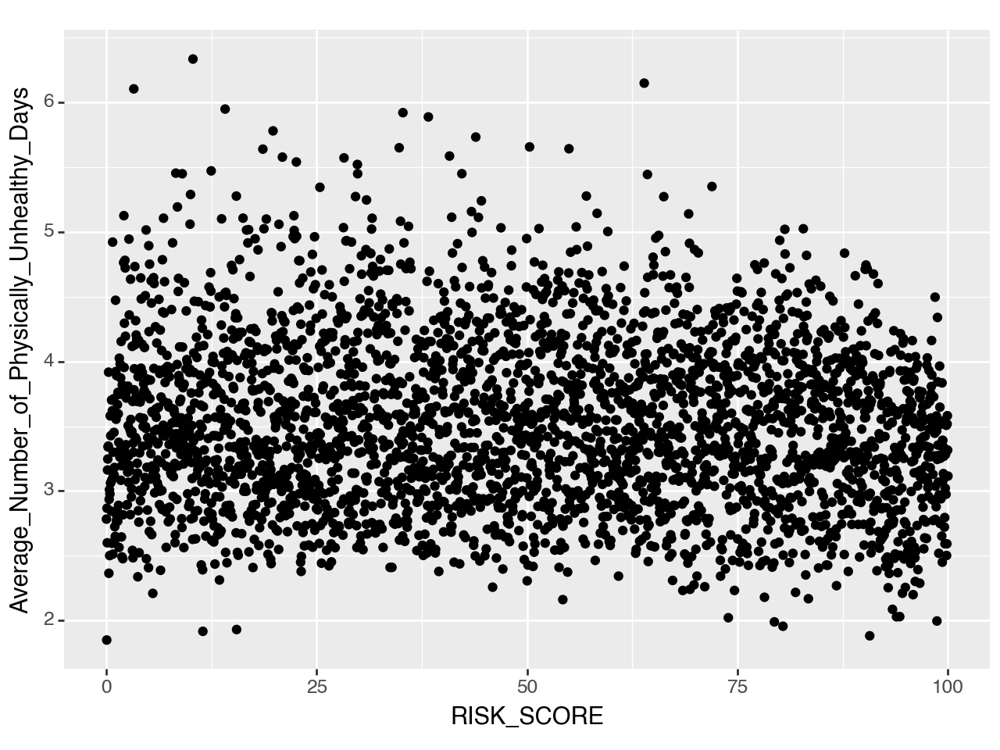

In [48]:
plot4 = (ggplot(Merged_County_Data) 
 + aes(x= "RISK_SCORE", y="Average_Number_of_Physically_Unhealthy_Days") 
 + geom_point())

print(plot4)



/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 92 rows containing missing values.


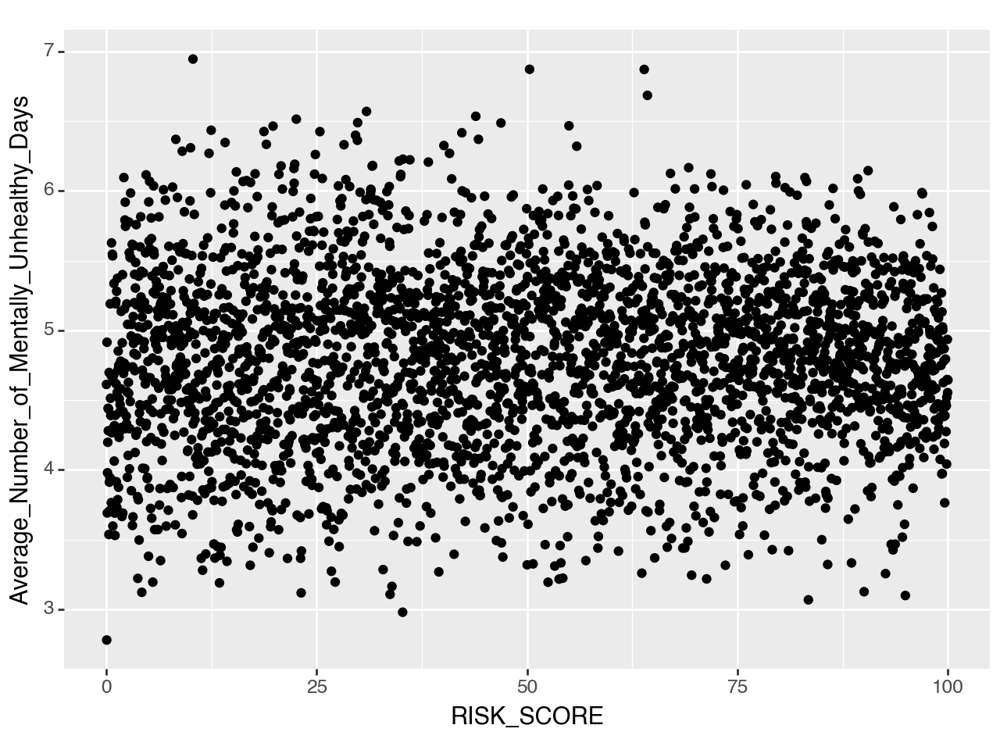

In [49]:
plot5 = (ggplot(Merged_County_Data) 
 + aes(x= "RISK_SCORE", y="Average_Number_of_Mentally_Unhealthy_Days") 
 + geom_point())

print(plot5)

/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 151 rows containing missing values.


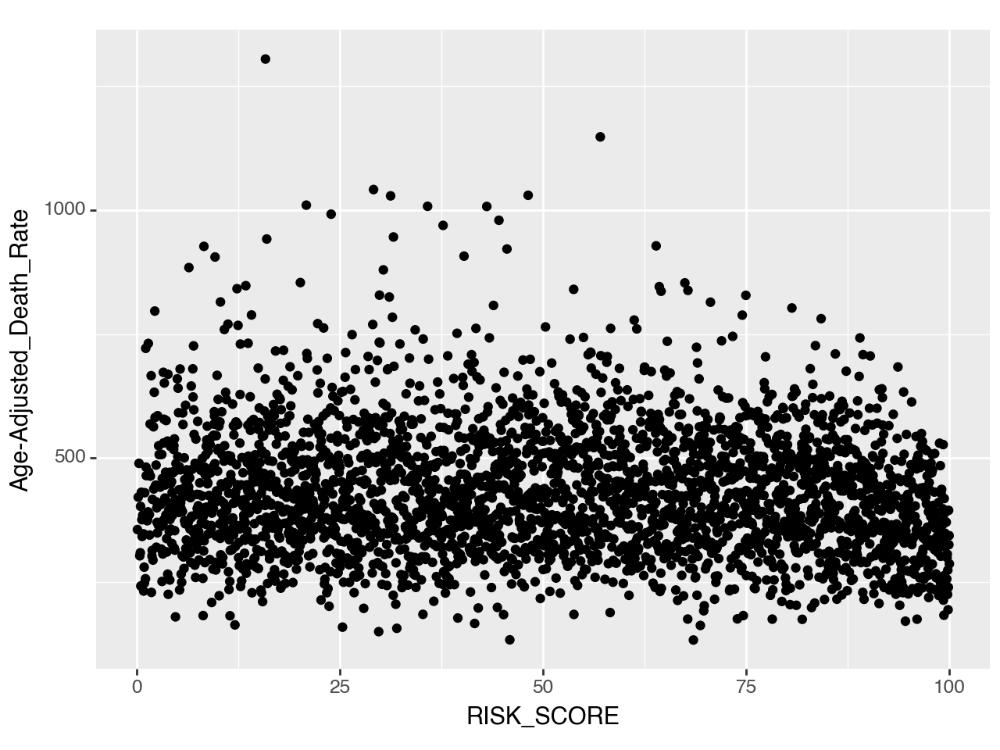

In [50]:
plot6 = (ggplot(Merged_County_Data) 
 + aes(x= "RISK_SCORE", y='Age-Adjusted_Death_Rate') 
 + geom_point())

print(plot6)



/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_boxplot : Removed 62 rows containing non-finite values.
/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_jitter : Removed 62 rows containing missing values.


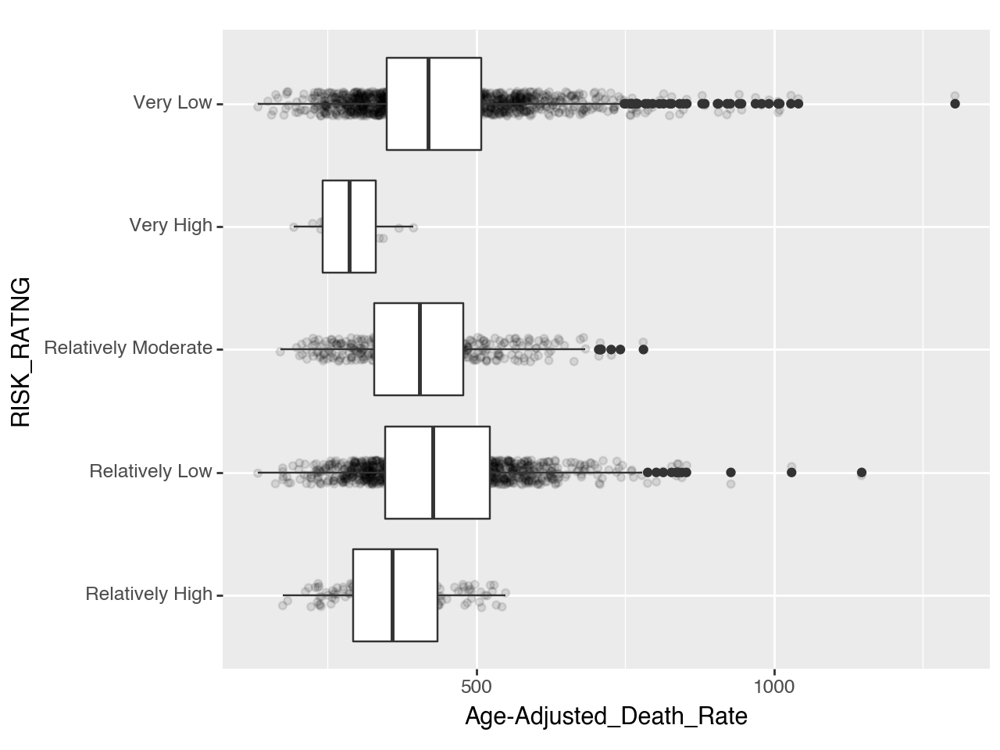

In [51]:
plot7 = (ggplot(Merged_County_Data_clean) 
 + aes(x= "RISK_RATNG", y='Age-Adjusted_Death_Rate')
 + geom_jitter(width = .1,alpha=.1,show_legend=False)
 + geom_boxplot()
 + coord_flip())

print(plot7)

In [52]:
#sns.boxplot(y='RISK_RATNG',x = 'Age-Adjusted_Death_Rate',data=Merged_County_Data_clean)
#plt.show()


/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_boxplot : Removed 72 rows containing non-finite values.
/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_jitter : Removed 72 rows containing missing values.


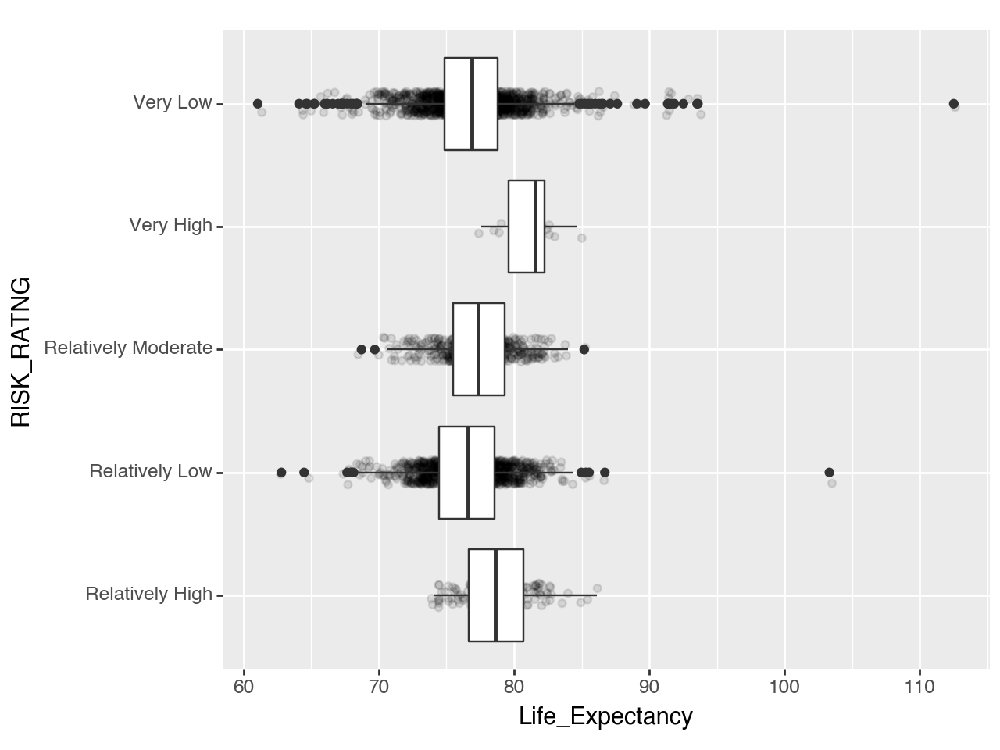

In [53]:
plot8 = (ggplot(Merged_County_Data_clean) 
 + aes(x= "RISK_RATNG", y='Life_Expectancy') 
 + geom_jitter(width = .1,alpha=.1,show_legend=False)
 + geom_boxplot()
 + coord_flip())

print(plot8)

/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_boxplot : Removed 3 rows containing non-finite values.
/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_jitter : Removed 3 rows containing missing values.


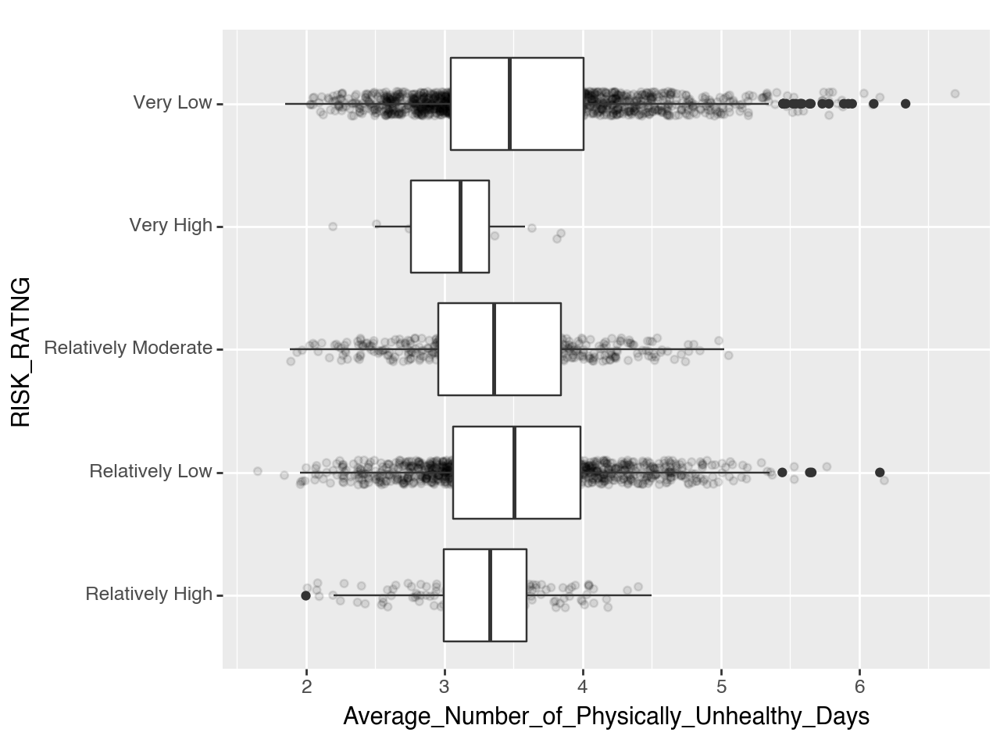

In [54]:
plot9 = (ggplot(Merged_County_Data_clean) 
 + aes(x= "RISK_RATNG", y='Average_Number_of_Physically_Unhealthy_Days') 
 + geom_jitter(width = .1,alpha=.1,show_legend=False)
 + geom_boxplot()
 + coord_flip())

print(plot9)

/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_boxplot : Removed 3 rows containing non-finite values.
/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_jitter : Removed 3 rows containing missing values.


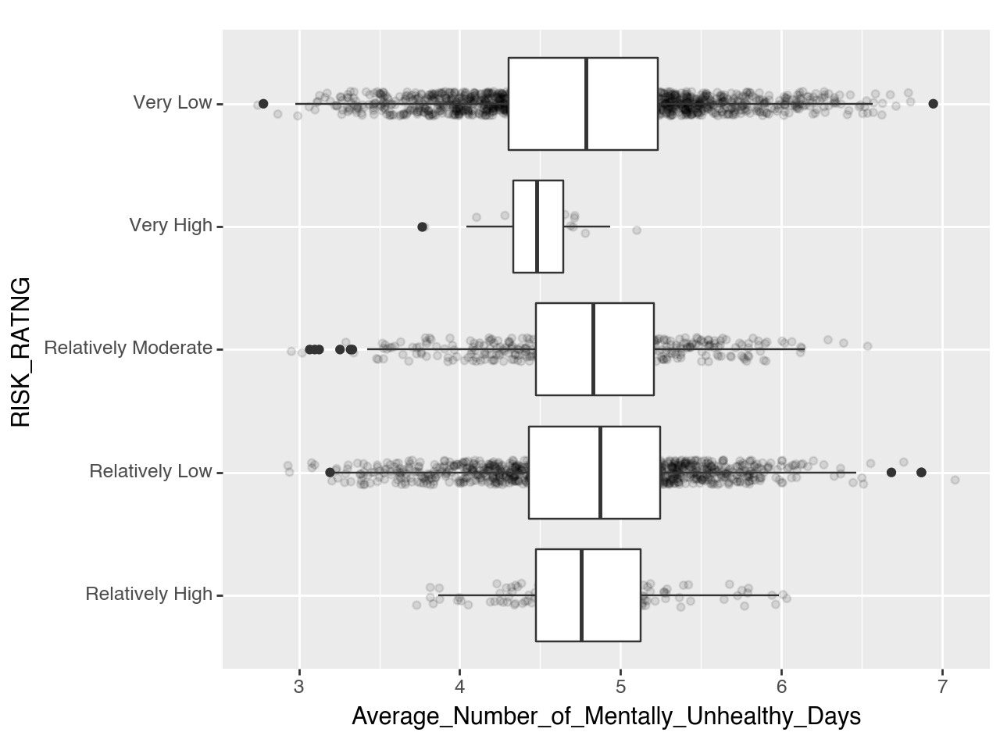

In [55]:
plot10 = (ggplot(Merged_County_Data_clean) 
 + aes(x= "RISK_RATNG", y='Average_Number_of_Mentally_Unhealthy_Days') 
 + geom_jitter(width = .1,alpha=.1,show_legend=False)
 + geom_boxplot()
 + coord_flip())

print(plot10)

/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 3 rows containing missing values.


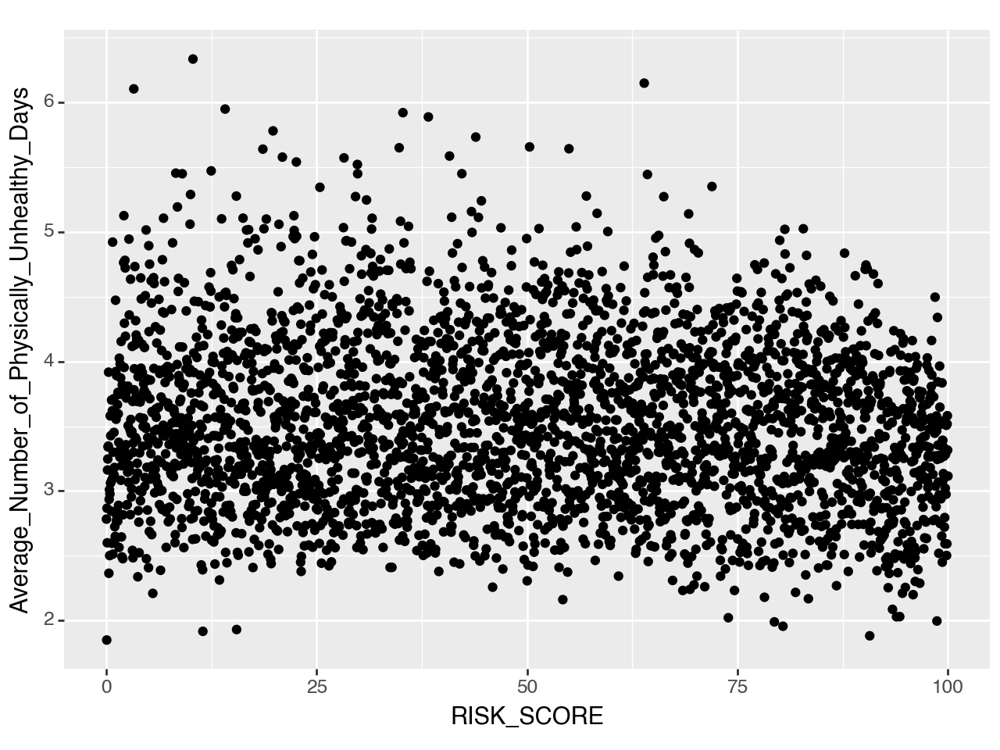

In [113]:
plot11 = (ggplot(Merged_County_Data_clean) 
 + aes(x= "RISK_SCORE", y='Average_Number_of_Physically_Unhealthy_Days') 
 + geom_point())

print(plot11)

/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 9 rows containing missing values.


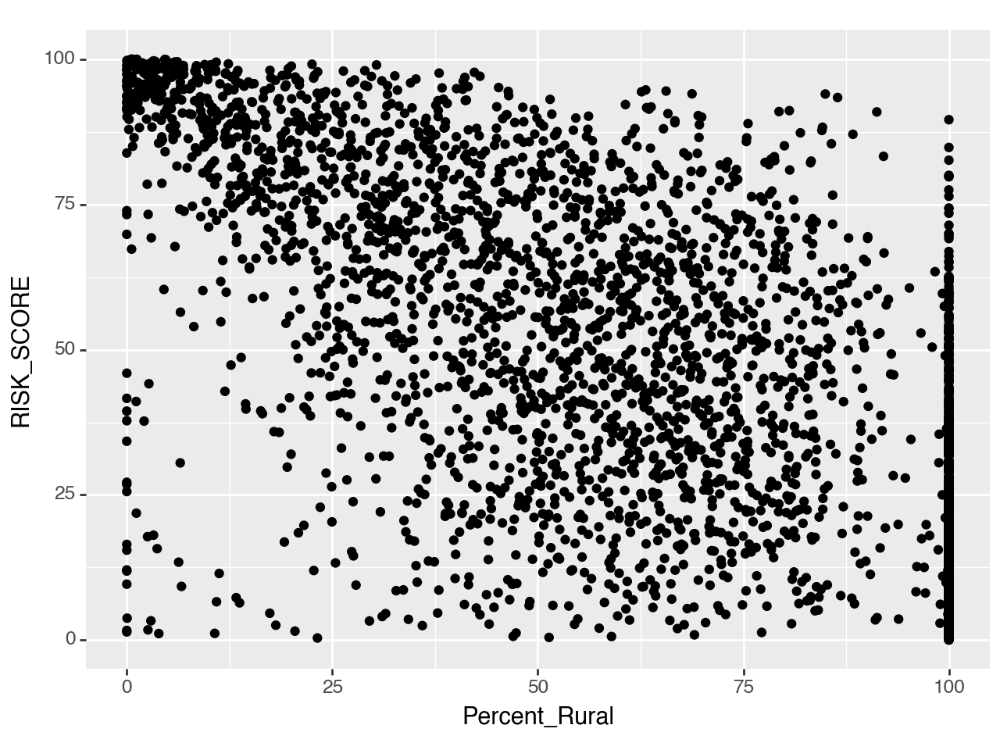

In [56]:
#county risk score versus percent rural

plot11 = (ggplot(Merged_County_Data_clean) 
 + aes(y= "RISK_SCORE", x='Percent_Rural') 
 + geom_point())

print(plot11)

In [57]:
Merged_County_Data_clean.sort_values("Percent_Rural", ascending = False).head(5)

,STATEABBRV,FIPS,POPULATION,AREA,RISK_SCORE,RISK_RATNG,EAL_SCORE,EAL_RATNG,SOVI_SCORE,SOVI_RATNG,...,Percent_Asian,Percent_Native_Hawaiian_or_Other_Pacific_Islander,Percent_Hispanic,Percent_Non-Hispanic_White,Percent_Not_Proficient_in_English,Percent_Female,Percent_Rural,Geolocation,County_State,Community_Type
869,IA,19159.0,4653.0,544.305638,20.076360,Very Low,22.717425,Very Low,18.709999,Very Low,...,0.883811,0.086225,2.823884,94.524682,0.112334,49.816771,100.0,POINT (-94.2442514 40.7353342),"Ringgold, IA",Rural
2442,TN,47027.0,7571.0,261.962018,10.467706,Very Low,8.016094,Very Low,64.769997,Relatively High,...,0.119126,0.119126,2.581072,94.070152,1.381788,50.430179,100.0,POINT (-85.5457173 36.5457493),"Clay, TN",Rural
2297,PA,42105.0,16396.0,1092.382878,4.199809,Very Low,4.363974,Very Low,48.029999,Relatively Moderate,...,0.467433,0.006150,1.642167,96.026816,0.607223,49.775509,100.0,POINT (-77.8944358 41.7485866),"Potter, PA",Rural
2786,UT,49017.0,5083.0,5260.781516,19.949093,Very Low,19.158155,Very Low,40.259998,Relatively Moderate,...,1.052837,0.292455,6.356015,88.165334,0.949968,47.338663,100.0,POINT (-111.4509076 37.8316645),"Garfield, UT",Rural
1994,ND,38007.0,945.0,1164.757517,3.913458,Very Low,5.416280,Very Low,5.790000,Very Low,...,3.979058,0.000000,3.036649,91.204188,0.000000,46.596859,100.0,POINT (-103.3640163 47.007044),"Billings, ND",Rural


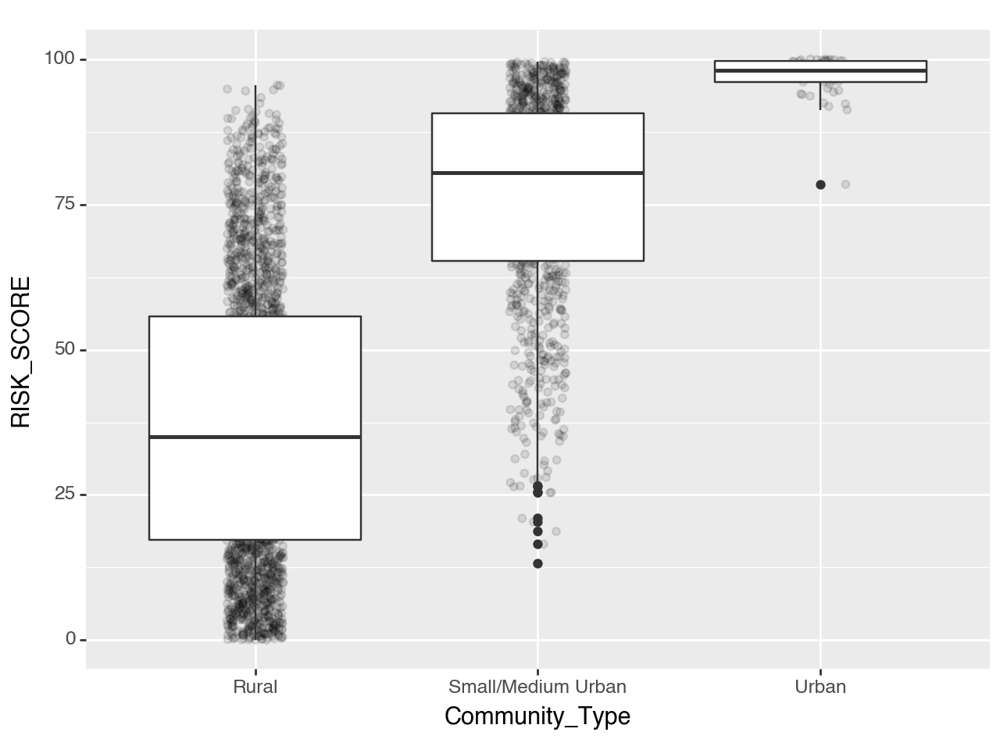

In [58]:
#plot community type and climate risk 
plot12 = (ggplot(Merged_County_Data_clean) 
 + aes(x= "Community_Type", y='RISK_SCORE') 
 + geom_jitter(width = .1,alpha=.1,show_legend=False)
 + geom_boxplot())

print(plot12)

In [59]:
Merged_County_Data_clean.loc[Merged_County_Data['Community_Type'] == 'Rural'].sort_values("RISK_SCORE", ascending = False).head(10)

,STATEABBRV,FIPS,POPULATION,AREA,RISK_SCORE,RISK_RATNG,EAL_SCORE,EAL_RATNG,SOVI_SCORE,SOVI_RATNG,...,Percent_Asian,Percent_Native_Hawaiian_or_Other_Pacific_Islander,Percent_Hispanic,Percent_Non-Hispanic_White,Percent_Not_Proficient_in_English,Percent_Female,Percent_Rural,Geolocation,County_State,Community_Type
1918,NC,37055.0,36860.0,1557.298013,95.482024,Relatively High,95.666976,Relatively High,27.719999,Relatively Low,...,0.964945,0.066092,7.605880,86.948131,1.569863,50.716438,28.959316,POINT (-75.7675364 35.6062688),"Dare, NC",Rural
192,CA,6011.0,21811.0,1168.027228,95.418390,Relatively Moderate,93.964717,Relatively Moderate,76.419998,Relatively High,...,1.560433,0.634211,61.258384,33.038281,13.309957,48.952868,31.724170,POINT (-122.2375629 39.1777385),"Colusa, CA",Rural
197,CA,6021.0,28889.0,1340.372922,94.813872,Relatively Moderate,94.026617,Relatively Moderate,88.540001,Very High,...,3.013366,0.253428,43.957646,49.109530,9.032768,48.699878,40.871915,POINT (-122.4016998 39.6025462),"Glenn, CA",Rural
1164,LA,22101.0,49313.0,1131.027710,94.718422,Relatively Moderate,93.902816,Relatively Moderate,86.379997,Very High,...,1.573644,0.082932,7.422458,56.045779,2.568902,50.449909,13.039341,POINT (-91.4638037 29.6293488),"St. Mary, LA",Rural
1897,NC,37013.0,44607.0,972.568215,94.495705,Relatively Moderate,93.469514,Relatively Moderate,84.599998,Very High,...,0.611676,0.089952,8.545471,65.793380,1.095249,52.026176,65.600201,POINT (-76.8420144 35.4823128),"Beaufort, NC",Rural
1921,NC,37061.0,48624.0,828.497933,93.382119,Relatively Moderate,91.612504,Relatively Moderate,90.129997,Very High,...,0.876018,0.583325,23.516438,50.446254,6.959848,50.741008,86.464405,POINT (-77.9335434 34.9344033),"Duplin, NC",Rural
2212,OR,41007.0,41036.0,1094.535576,92.363983,Relatively Moderate,91.736305,Relatively Moderate,56.080002,Relatively Moderate,...,1.664674,0.356374,9.186797,84.448696,1.189986,50.246353,38.972434,POINT (-123.7050366 46.0245094),"Clatsop, OR",Rural
26,AL,1053.0,36706.0,962.761819,91.377665,Relatively Moderate,89.755494,Relatively Moderate,87.080002,Very High,...,0.318810,0.076296,2.648574,60.077931,0.500475,49.480912,63.511574,POINT (-87.1684097 31.1222867),"Escambia, AL",Rural
345,FL,12051.0,39371.0,1201.385234,91.154948,Relatively Moderate,86.010523,Relatively Moderate,99.589996,Very High,...,1.088979,0.228214,56.510307,29.796840,14.041611,47.101431,37.892182,POINT (-81.1521142 26.539967),"Hendry, FL",Rural
1899,NC,37017.0,29597.0,896.744081,90.900414,Relatively Moderate,88.579387,Relatively Moderate,87.650002,Very High,...,0.508044,0.050804,8.247248,54.574090,1.077941,52.535140,91.233305,POINT (-78.5394885 34.5919375),"Bladen, NC",Rural


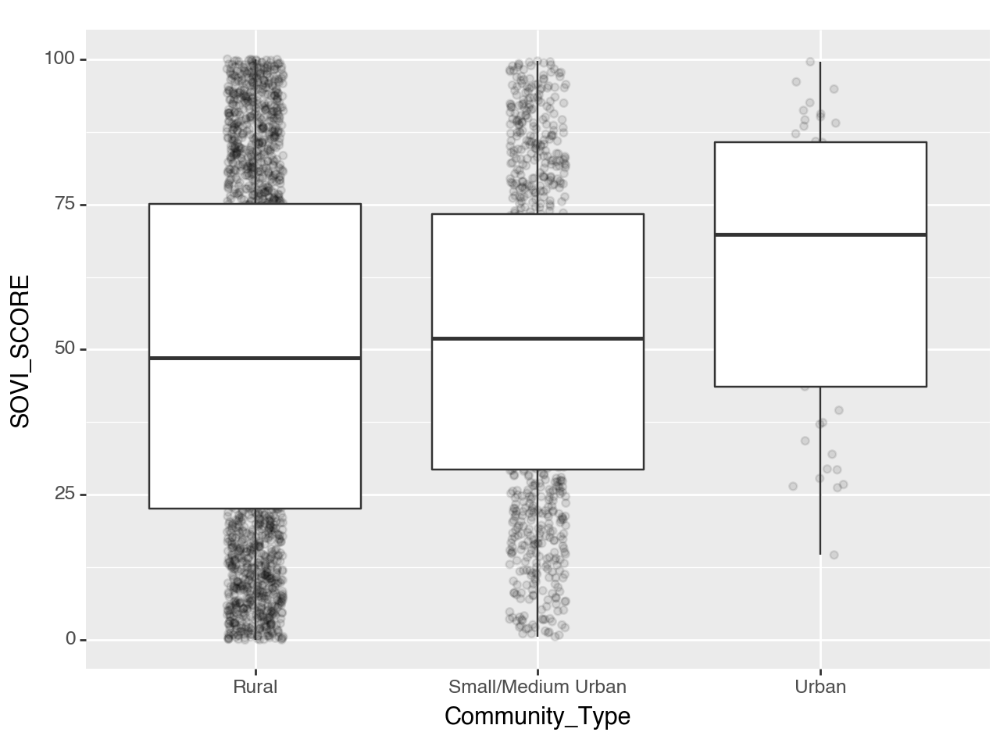

In [60]:
#social vulnerability score and community type
plot13 = (ggplot(Merged_County_Data_clean) 
 + aes(x= "Community_Type", y='SOVI_SCORE') 
 + geom_jitter(width = .1,alpha=.1,show_legend=False)
 + geom_boxplot())

print(plot13)

/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 9 rows containing missing values.


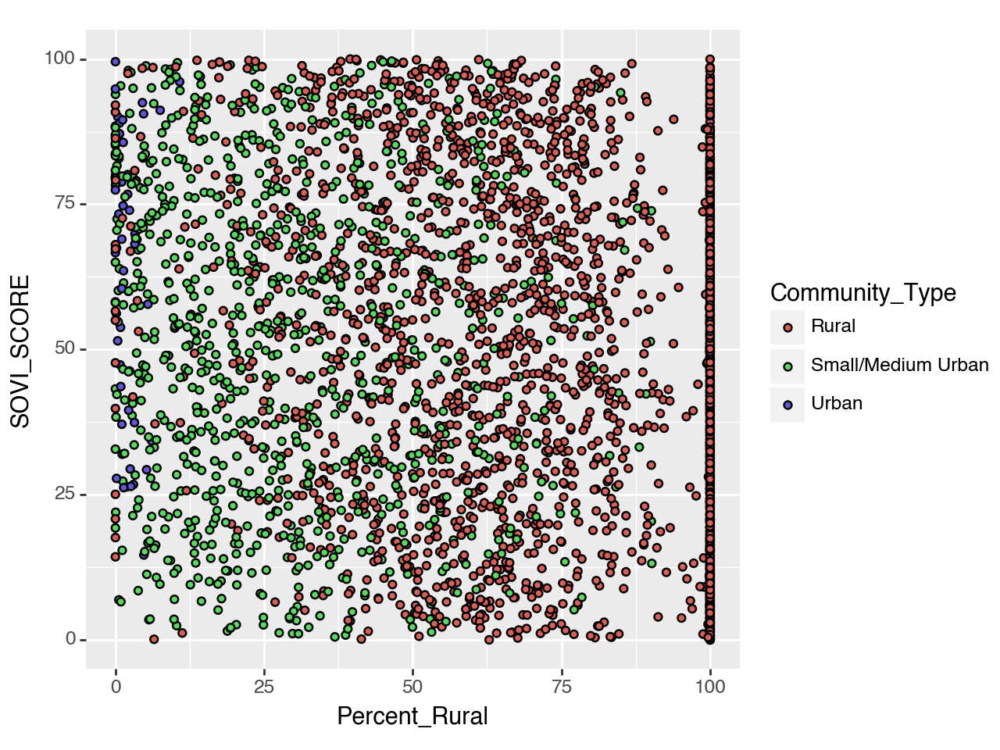

In [61]:
plot14 = (ggplot(Merged_County_Data_clean) 
 + aes(y= "SOVI_SCORE", x='Percent_Rural', fill = "Community_Type") 
 + geom_point())

print(plot14)

#KL - what are the small/medium metro areas that are more than 75% rural??

In [62]:
Merged_County_Data_clean.loc[Merged_County_Data['Community_Type'] == 'Small/Medium Urban'].sort_values("Percent_Rural", ascending = False).head(5)

,STATEABBRV,FIPS,POPULATION,AREA,RISK_SCORE,RISK_RATNG,EAL_SCORE,EAL_RATNG,SOVI_SCORE,SOVI_RATNG,...,Percent_Asian,Percent_Native_Hawaiian_or_Other_Pacific_Islander,Percent_Hispanic,Percent_Non-Hispanic_White,Percent_Not_Proficient_in_English,Percent_Female,Percent_Rural,Geolocation,County_State,Community_Type
1766,NH,33003.0,50016.0,1003.522927,59.338212,Relatively Low,62.488394,Relatively Low,13.180000,Very Low,...,0.821359,0.027184,1.700971,95.403883,0.068493,50.133981,90.202434,POINT (-71.2015596 43.8677742),"Carroll, NH",Small/Medium Urban
24,AL,1049.0,71379.0,786.523685,69.424117,Relatively Low,64.747756,Relatively Low,73.870003,Relatively High,...,0.512442,0.640553,15.791013,79.002409,3.759745,50.149694,90.130645,POINT (-85.8040207 34.4609148),"DeKalb, AL",Small/Medium Urban
1182,ME,23009.0,55442.0,2368.603302,69.137766,Relatively Low,70.133086,Relatively Low,20.430000,Relatively Low,...,1.302677,0.037372,1.720886,94.113041,0.167899,51.352506,90.113565,POINT (-68.3707034 44.5649063),"Hancock, ME",Small/Medium Urban
4,AL,1009.0,58992.0,657.196555,65.128858,Relatively Low,63.633550,Relatively Low,51.369999,Relatively Moderate,...,0.403110,0.123643,9.867719,86.329839,1.726907,50.192239,89.951502,POINT (-86.56644 33.9773575),"Blount, AL",Small/Medium Urban
2853,VA,51067.0,54455.0,718.799727,13.172129,Very Low,14.268028,Very Low,42.360001,Relatively Moderate,...,0.536969,0.061888,3.070734,86.887036,0.523999,50.356766,89.230577,POINT (-79.8827149 36.9911862),"Franklin, VA",Small/Medium Urban


/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 62 rows containing missing values.


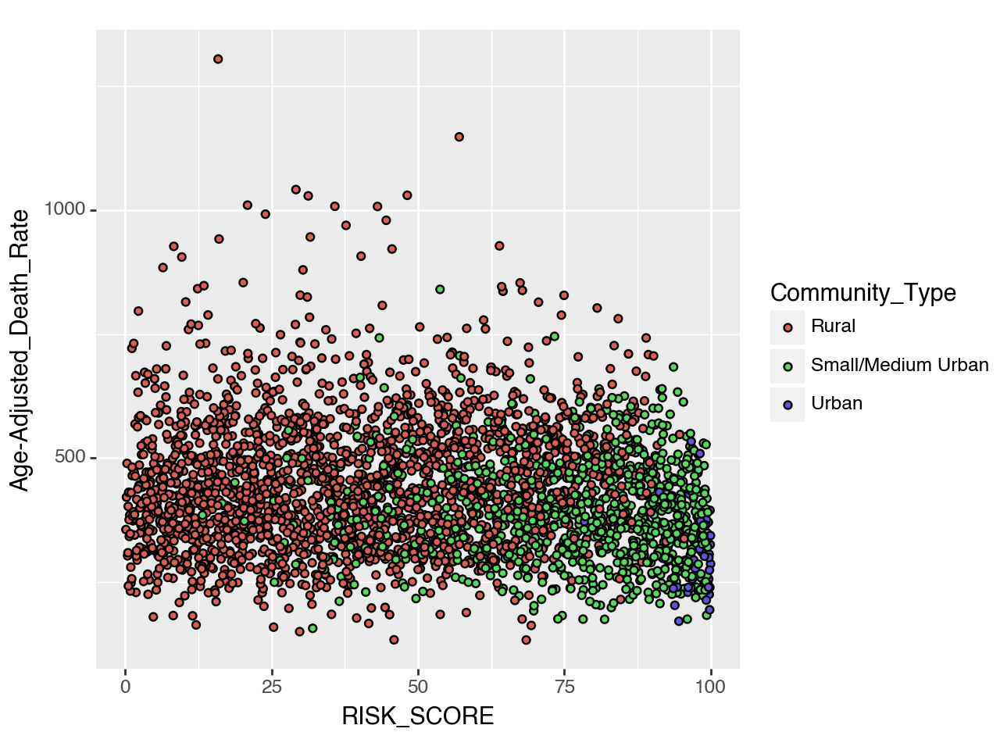

In [63]:
plot15 = (ggplot(Merged_County_Data_clean) 
 + aes(x= "RISK_SCORE", y='Age-Adjusted_Death_Rate', fill = "Community_Type") 
 + geom_point())

print(plot15)

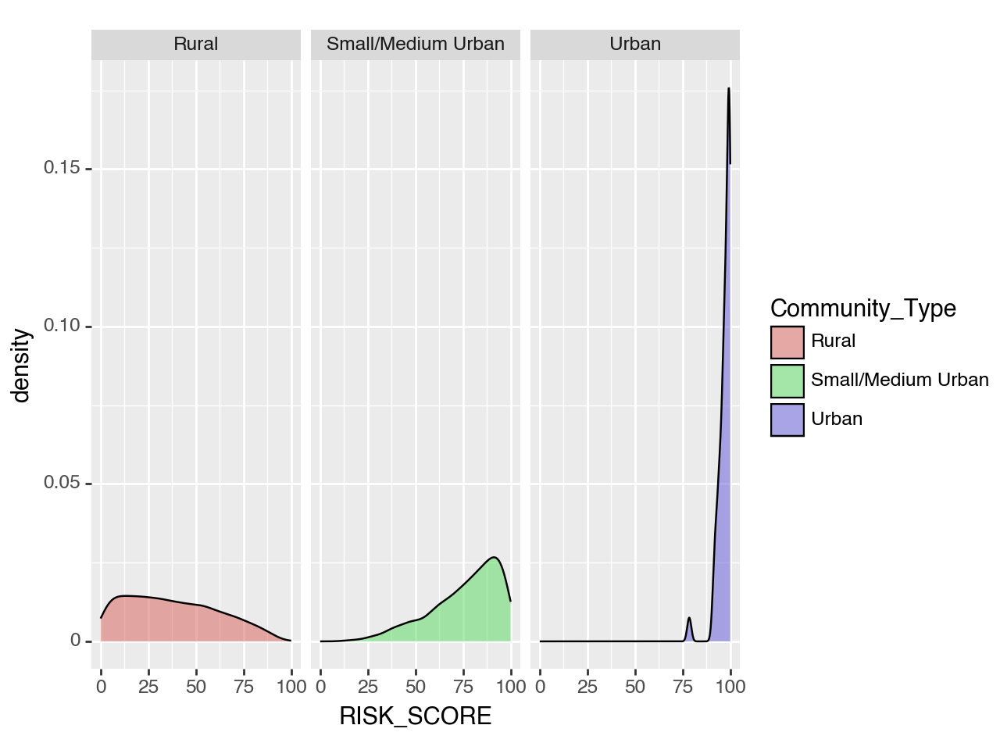

<Figure Size: (640 x 480)>

In [64]:
(ggplot(Merged_County_Data_clean, aes(x = 'RISK_SCORE', fill="Community_Type")) +
  geom_density(color="black",alpha=.5)+
  xlim(0,100) +
  facet_grid(" ~ Community_Type"))

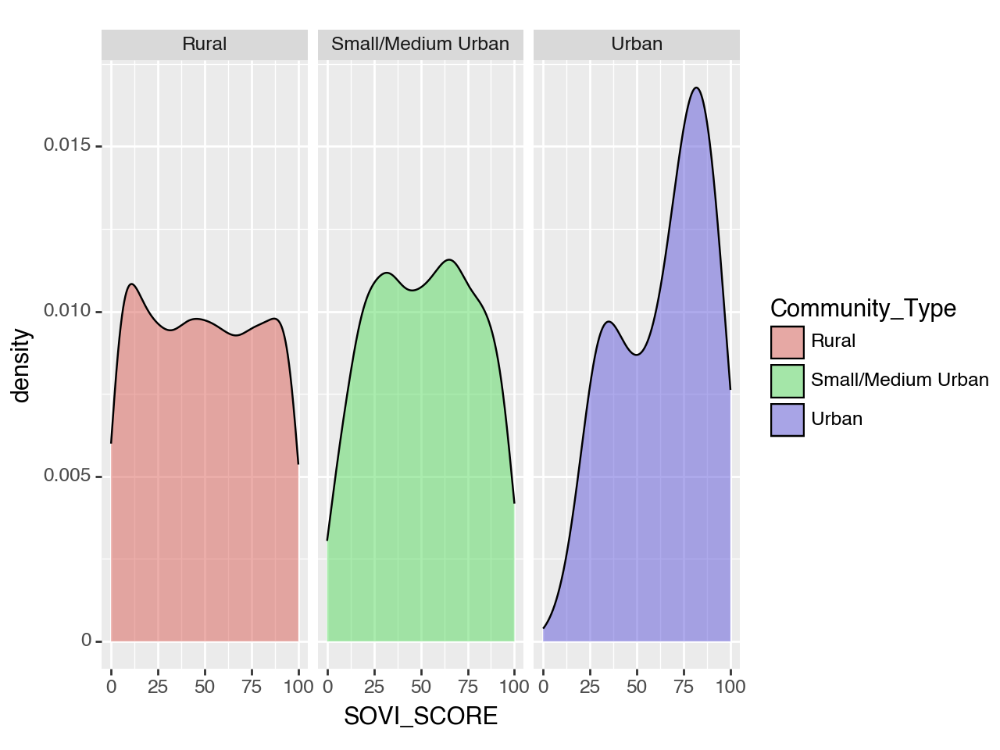

<Figure Size: (640 x 480)>

In [65]:
(ggplot(Merged_County_Data_clean, aes(x = 'SOVI_SCORE', fill="Community_Type")) +
  geom_density(color="black",alpha=.5)+
  xlim(0,100) +
  facet_grid(" ~ Community_Type"))

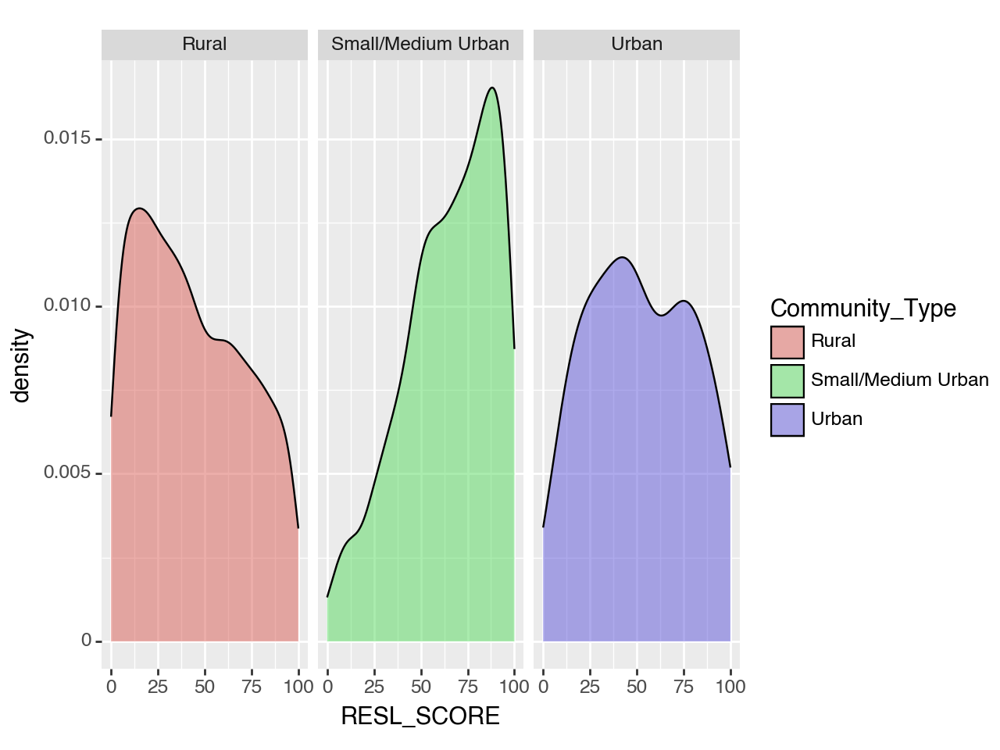

<Figure Size: (640 x 480)>

In [66]:
(ggplot(Merged_County_Data_clean, aes(x = 'RESL_SCORE', fill="Community_Type")) +
  geom_density(color="black",alpha=.5)+
  xlim(0,100) +
  facet_grid(" ~ Community_Type"))

/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 3 rows containing missing values.


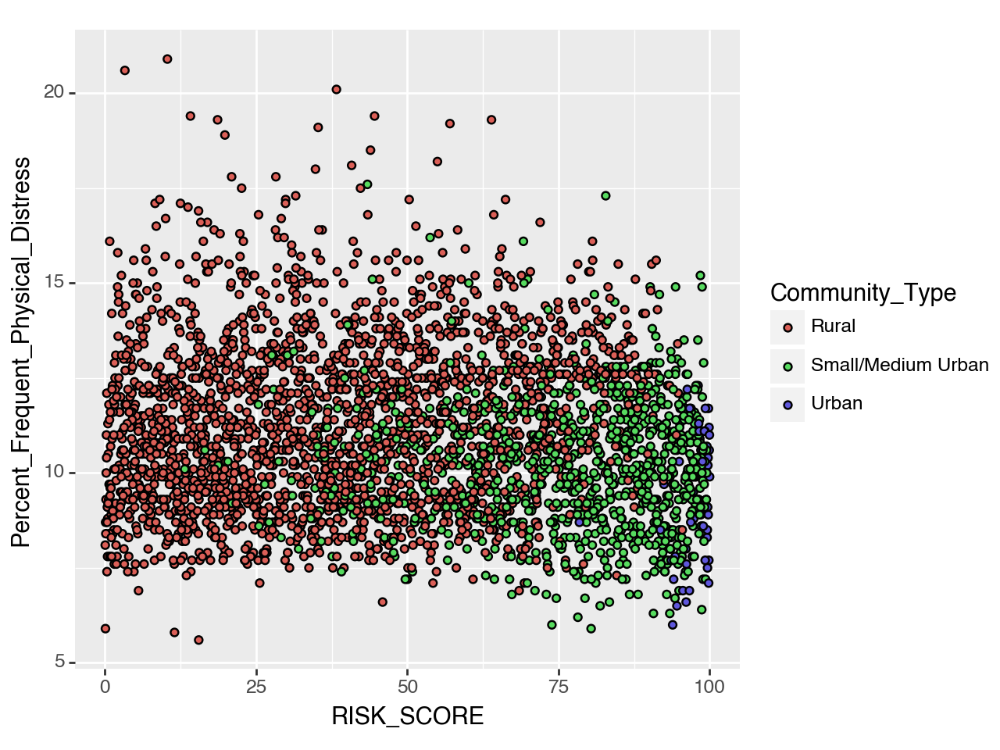

In [67]:
plot17 = (ggplot(Merged_County_Data_clean) 
 + aes(x= "RISK_SCORE", y='Percent_Frequent_Physical_Distress', fill = "Community_Type") 
 + geom_point())

print(plot17)

/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 3 rows containing missing values.


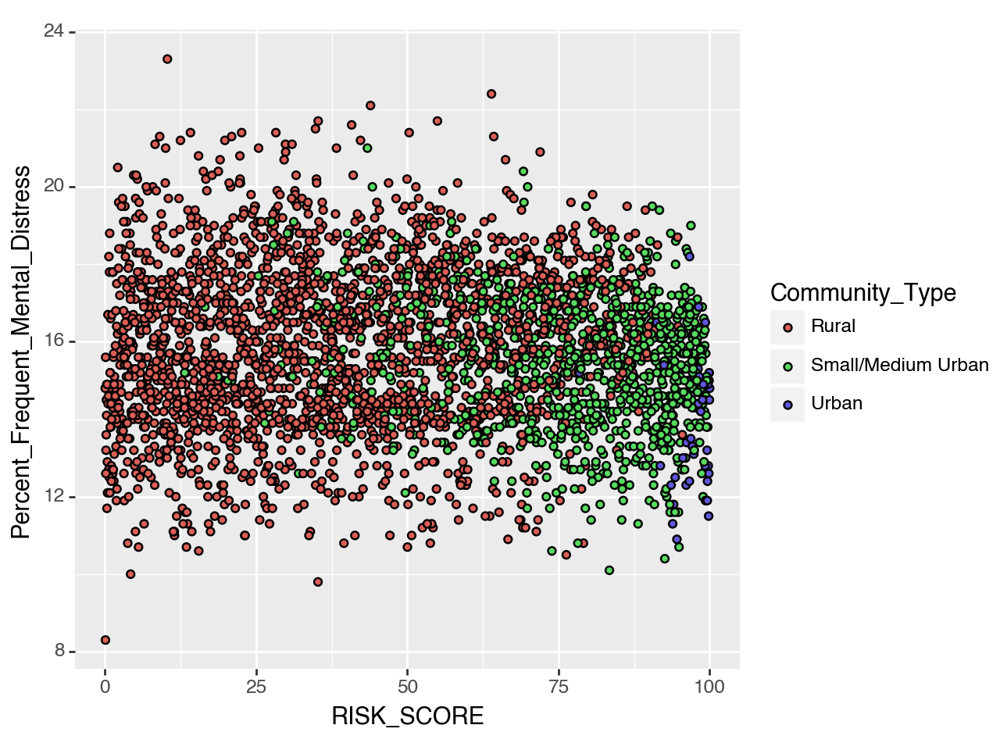

In [68]:
plot18 = (ggplot(Merged_County_Data_clean) 
 + aes(x= "RISK_SCORE", y='Percent_Frequent_Mental_Distress', fill = "Community_Type") 
 + geom_point())

print(plot18)

/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_boxplot : Removed 3 rows containing non-finite values.
/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_jitter : Removed 3 rows containing missing values.


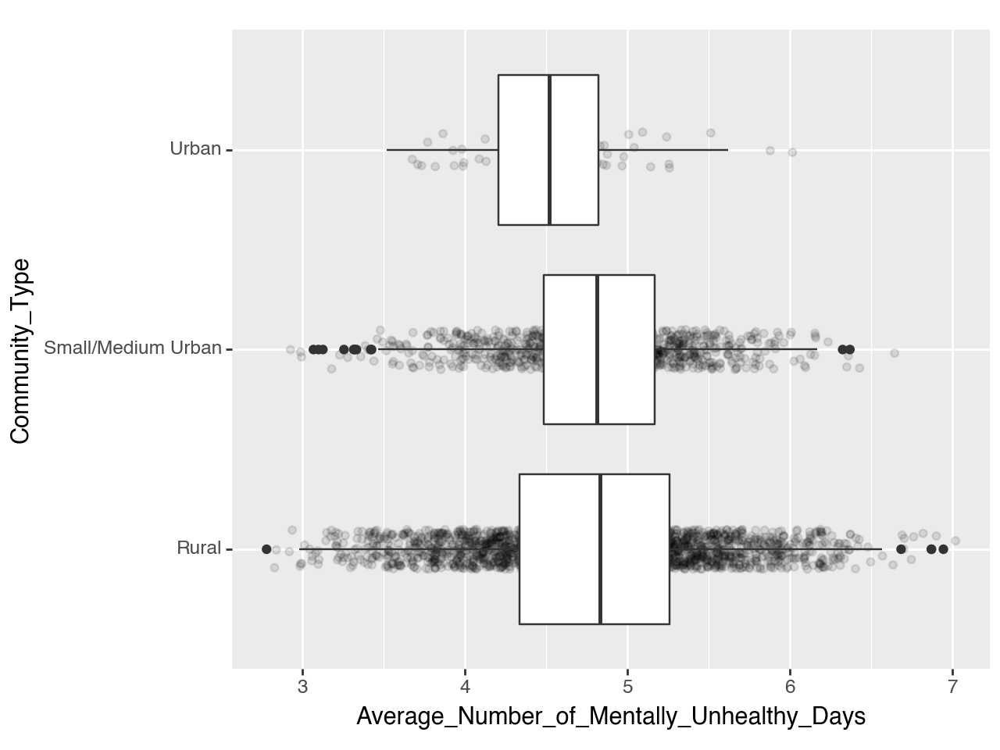

In [69]:
plot19 = (ggplot(Merged_County_Data_clean) 
 + aes(x= "Community_Type", y='Average_Number_of_Mentally_Unhealthy_Days') 
 + geom_jitter(width = .1,alpha=.1,show_legend=False)
 + geom_boxplot()
 + coord_flip())

print(plot19)

/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_boxplot : Removed 3 rows containing non-finite values.
/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_jitter : Removed 3 rows containing missing values.


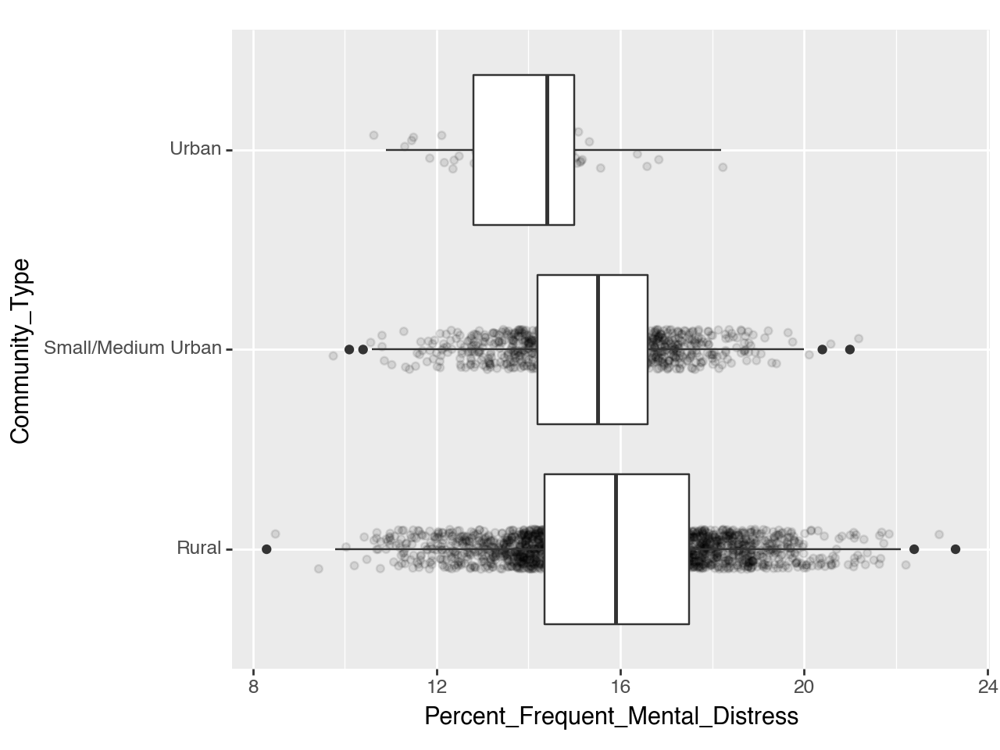

<Figure Size: (640 x 480)>

In [70]:
(ggplot(Merged_County_Data_clean) 
 + aes(x= "Community_Type", y='Percent_Frequent_Mental_Distress') 
 + geom_jitter(width = .1,alpha=.1,show_legend=False)
 + geom_boxplot()
 + coord_flip())


/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 28 rows containing missing values.


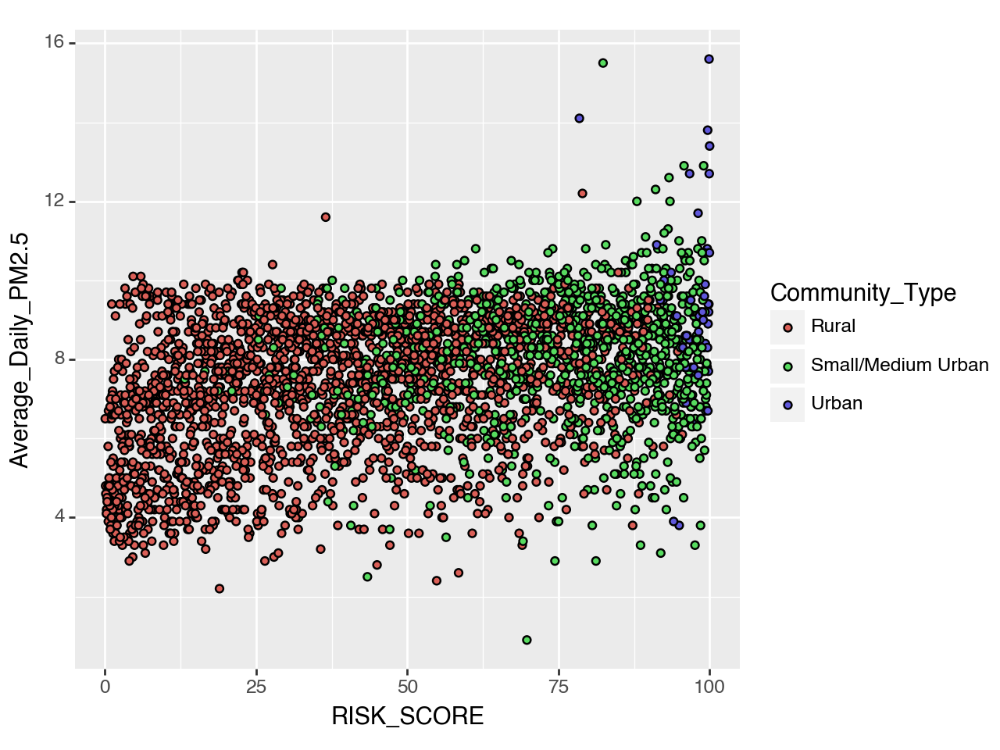

<Figure Size: (640 x 480)>

In [71]:
#air pollution particulate matter
(ggplot(Merged_County_Data_clean) 
 + aes(x= "RISK_SCORE", y='Average_Daily_PM2.5', fill = "Community_Type") 
 + geom_point())


/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_boxplot : Removed 28 rows containing non-finite values.
/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_jitter : Removed 28 rows containing missing values.


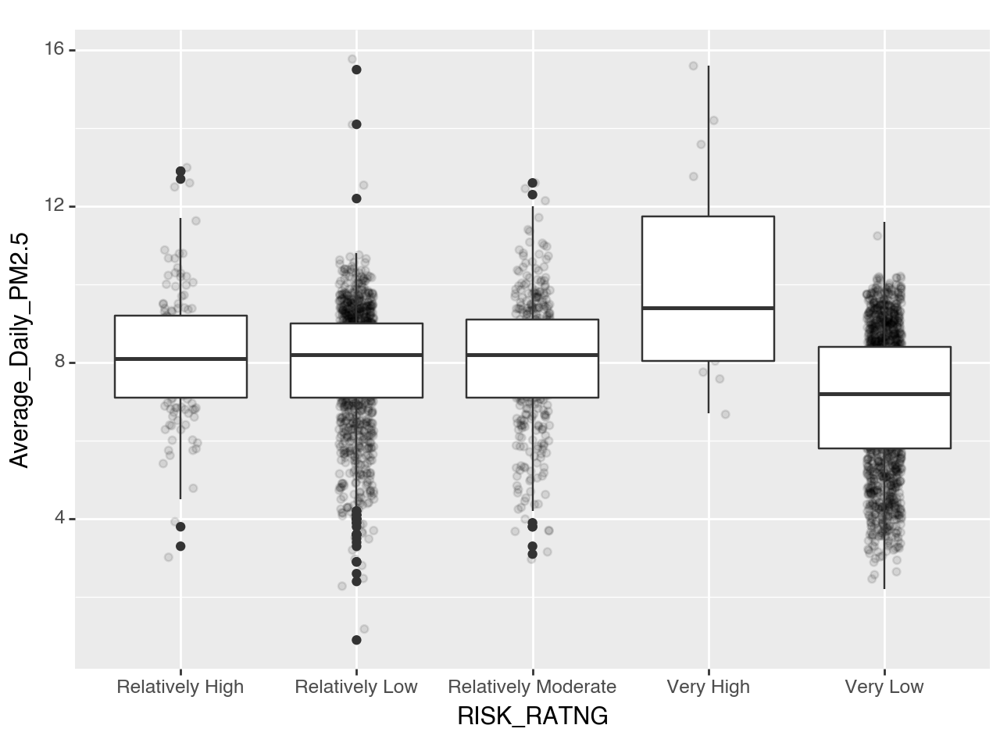

<Figure Size: (640 x 480)>

In [72]:
(ggplot(Merged_County_Data_clean) 
 + aes(x= "RISK_RATNG", y='Average_Daily_PM2.5') 
 + geom_jitter(width = .1,alpha=.1,show_legend=False)
 + geom_boxplot())

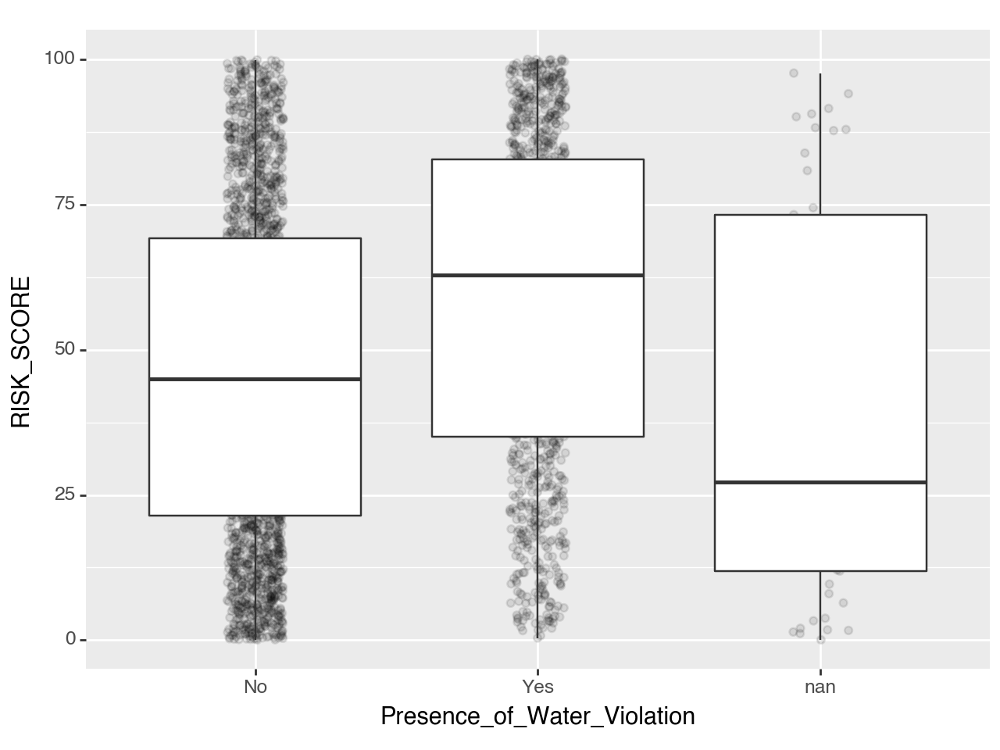

<Figure Size: (640 x 480)>

In [73]:
(ggplot(Merged_County_Data_clean) 
 + aes(y= "RISK_SCORE", x='Presence_of_Water_Violation') 
 + geom_jitter(width = .1,alpha=.1,show_legend=False)
 + geom_boxplot())

### Further Cleaning and Plotting

In [74]:
# create function to classify community type by population of county
# use 250,000 pop size for medium counties

def community_type_classification(population):
    '''
    Add description here.
    '''
    if population < 50000:
        return("Rural")
    elif population < 250000:
        return("Small/Medium Urban") # could maybe rename this? "Metro" or something?
    else:
        return("Urban")

In [75]:
# create new community type column with different parameters
Merged_County_Data_clean['Community_Type'] = [community_type_classification(x) for x in Merged_County_Data_clean['POPULATION']]

/var/folders/zd/g468sr211nz26mz91q_cxlkr0000gn/T/ipykernel_92883/685896590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [76]:
Merged_County_Data_clean.Community_Type.value_counts()

# the number of urban counties jumps from 50 to 279

Community_Type
Rural                 2154
Small/Medium Urban     712
Urban                  277
Name: count, dtype: int64

In [77]:
# create density column
Merged_County_Data_clean['Population_Density'] = Merged_County_Data_clean['POPULATION'] / Merged_County_Data_clean['AREA']

Merged_County_Data_clean.head()

/var/folders/zd/g468sr211nz26mz91q_cxlkr0000gn/T/ipykernel_92883/2988376501.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,STATEABBRV,FIPS,POPULATION,AREA,RISK_SCORE,RISK_RATNG,EAL_SCORE,EAL_RATNG,SOVI_SCORE,SOVI_RATNG,...,Percent_Native_Hawaiian_or_Other_Pacific_Islander,Percent_Hispanic,Percent_Non-Hispanic_White,Percent_Not_Proficient_in_English,Percent_Female,Percent_Rural,Geolocation,County_State,Community_Type,Population_Density
0,AL,1001.0,58764.0,610.470508,49.220490,Relatively Low,50.943980,Very Low,51.299999,Relatively Moderate,...,0.118453,3.326847,72.454522,0.231241,51.378289,42.002162,POINT (-86.6464395 32.5322367),"Autauga, AL",Small/Medium Urban,96.260178
1,AL,1003.0,231365.0,2047.738775,97.709195,Relatively High,98.235840,Relatively High,31.030001,Relatively Low,...,0.068535,4.841743,83.148763,0.759661,51.347715,42.279099,POINT (-87.7460666 30.6592183),"Baldwin, AL",Small/Medium Urban,112.985603
2,AL,1005.0,25160.0,913.646511,56.188355,Relatively Low,44.877747,Very Low,99.269997,Very High,...,0.232335,4.959141,45.305240,1.382681,46.703253,67.789635,POINT (-85.4051035 31.8702531),"Barbour, AL",Rural,27.538003
3,AL,1007.0,22239.0,632.486798,32.484887,Very Low,30.485918,Very Low,80.779999,Very High,...,0.129021,3.087601,73.564088,0.443062,46.015927,68.352607,POINT (-87.1271475 33.0158929),"Bibb, AL",Rural,35.161208
4,AL,1009.0,58992.0,657.196555,65.128858,Relatively Low,63.633550,Relatively Low,51.369999,Relatively Moderate,...,0.123643,9.867719,86.329839,1.726907,50.192239,89.951502,POINT (-86.56644 33.9773575),"Blount, AL",Small/Medium Urban,89.763100


In [78]:
# filter out "Percent_Not_Proficient_in_English" - not needed for our analysis
del Merged_County_Data_clean['Percent_Not_Proficient_in_English']

# python didn't like df.drop 

Merged_County_Data_clean.head()


,STATEABBRV,FIPS,POPULATION,AREA,RISK_SCORE,RISK_RATNG,EAL_SCORE,EAL_RATNG,SOVI_SCORE,SOVI_RATNG,...,Percent_Asian,Percent_Native_Hawaiian_or_Other_Pacific_Islander,Percent_Hispanic,Percent_Non-Hispanic_White,Percent_Female,Percent_Rural,Geolocation,County_State,Community_Type,Population_Density
0,AL,1001.0,58764.0,610.470508,49.220490,Relatively Low,50.943980,Very Low,51.299999,Relatively Moderate,...,1.203147,0.118453,3.326847,72.454522,51.378289,42.002162,POINT (-86.6464395 32.5322367),"Autauga, AL",Small/Medium Urban,96.260178
1,AL,1003.0,231365.0,2047.738775,97.709195,Relatively High,98.235840,Relatively High,31.030001,Relatively Low,...,1.122469,0.068535,4.841743,83.148763,51.347715,42.279099,POINT (-87.7460666 30.6592183),"Baldwin, AL",Small/Medium Urban,112.985603
2,AL,1005.0,25160.0,913.646511,56.188355,Relatively Low,44.877747,Very Low,99.269997,Very High,...,0.460663,0.232335,4.959141,45.305240,46.703253,67.789635,POINT (-85.4051035 31.8702531),"Barbour, AL",Rural,27.538003
3,AL,1007.0,22239.0,632.486798,32.484887,Very Low,30.485918,Very Low,80.779999,Very High,...,0.275838,0.129021,3.087601,73.564088,46.015927,68.352607,POINT (-87.1271475 33.0158929),"Bibb, AL",Rural,35.161208
4,AL,1009.0,58992.0,657.196555,65.128858,Relatively Low,63.633550,Relatively Low,51.369999,Relatively Moderate,...,0.403110,0.123643,9.867719,86.329839,50.192239,89.951502,POINT (-86.56644 33.9773575),"Blount, AL",Small/Medium Urban,89.763100


In [79]:
# Reorder columns

# Specify the desired column order
column_order = ['FIPS', 'STATEABBRV', 'State', 'County', 'County_State', 'Community_Type', 'POPULATION', 'Population', 
                'AREA',
                'Population_Density','Percent_Rural', 'RISK_SCORE', 'RISK_RATNG',
       'EAL_SCORE', 'EAL_RATNG', 'SOVI_SCORE', 'SOVI_RATNG', 'RESL_SCORE',
       'RESL_RATNG', 'Percent_Fair_or_Poor_Health',
       'Average_Number_of_Physically_Unhealthy_Days',
       'Average_Number_of_Mentally_Unhealthy_Days',
       'Number_Primary_Care_Physicians', 'Primary_Care_Physicians_Rate',
       'Primary_Care_Physicians_Ratio', 'Number_Dentists', 'Dentist_Rate',
       'Dentist_Ratio', 'Number_Mental_Health_Providers',
       'Mental_Health_Provider_Rate', 'Mental_Health_Provider_Ratio',
       'Average_Daily_PM2.5', 'Presence_of_Water_Violation', 
       'Life_Expectancy', 'Age-Adjusted_Death_Rate',
       'Percent_Frequent_Physical_Distress',
       'Percent_Frequent_Mental_Distress',
       'Percent_Less_than_18_Years_of_Age', 'Percent_65_and_Over',
       'Percent_American_Indian_or_Alaska_Native', 'Percent_Asian',
       'Percent_Native_Hawaiian_or_Other_Pacific_Islander', 'Percent_Hispanic',
       'Percent_Non-Hispanic_White', 'Percent_Female',
       'Geolocation']

# Reorder the columns in the original DataFrame
Merged_County_Data_clean = Merged_County_Data_clean[column_order]

# reordered dataframe
Merged_County_Data_clean.head()

# why are there two different population columns...?

,FIPS,STATEABBRV,State,County,County_State,Community_Type,POPULATION,Population,AREA,Population_Density,...,Percent_Frequent_Mental_Distress,Percent_Less_than_18_Years_of_Age,Percent_65_and_Over,Percent_American_Indian_or_Alaska_Native,Percent_Asian,Percent_Native_Hawaiian_or_Other_Pacific_Islander,Percent_Hispanic,Percent_Non-Hispanic_White,Percent_Female,Geolocation
0,1001.0,AL,Alabama,Autauga,"Autauga, AL",Small/Medium Urban,58764.0,59095.0,610.470508,96.260178,...,16.2,23.406380,16.048735,0.458584,1.203147,0.118453,3.326847,72.454522,51.378289,POINT (-86.6464395 32.5322367)
1,1003.0,AL,Alabama,Baldwin,"Baldwin, AL",Small/Medium Urban,231365.0,239294.0,2047.738775,112.985603,...,16.1,21.218250,21.469824,0.800271,1.122469,0.068535,4.841743,83.148763,51.347715,POINT (-87.7460666 30.6592183)
2,1005.0,AL,Alabama,Barbour,"Barbour, AL",Rural,25160.0,24964.0,913.646511,27.538003,...,18.0,20.549591,19.976767,0.725044,0.460663,0.232335,4.959141,45.305240,46.703253,POINT (-85.4051035 31.8702531)
3,1007.0,AL,Alabama,Bibb,"Bibb, AL",Rural,22239.0,22477.0,632.486798,35.161208,...,17.4,20.118343,16.737109,0.502736,0.275838,0.129021,3.087601,73.564088,46.015927,POINT (-87.1271475 33.0158929)
4,1009.0,AL,Alabama,Blount,"Blount, AL",Small/Medium Urban,58992.0,59041.0,657.196555,89.763100,...,17.4,23.053471,18.725970,0.660558,0.403110,0.123643,9.867719,86.329839,50.192239,POINT (-86.56644 33.9773575)


In [80]:
print(Merged_County_Data_clean.columns)

Index(['FIPS', 'STATEABBRV', 'State', 'County', 'County_State',
       'Community_Type', 'POPULATION', 'Population', 'AREA',
       'Population_Density', 'Percent_Rural', 'RISK_SCORE', 'RISK_RATNG',
       'EAL_SCORE', 'EAL_RATNG', 'SOVI_SCORE', 'SOVI_RATNG', 'RESL_SCORE',
       'RESL_RATNG', 'Percent_Fair_or_Poor_Health',
       'Average_Number_of_Physically_Unhealthy_Days',
       'Average_Number_of_Mentally_Unhealthy_Days',
       'Number_Primary_Care_Physicians', 'Primary_Care_Physicians_Rate',
       'Primary_Care_Physicians_Ratio', 'Number_Dentists', 'Dentist_Rate',
       'Dentist_Ratio', 'Number_Mental_Health_Providers',
       'Mental_Health_Provider_Rate', 'Mental_Health_Provider_Ratio',
       'Average_Daily_PM2.5', 'Presence_of_Water_Violation', 'Life_Expectancy',
       'Age-Adjusted_Death_Rate', 'Percent_Frequent_Physical_Distress',
       'Percent_Frequent_Mental_Distress', 'Percent_Less_than_18_Years_of_Age',
       'Percent_65_and_Over', 'Percent_American_Indian_or_Al

### Plotting Exploration with Density and Rural

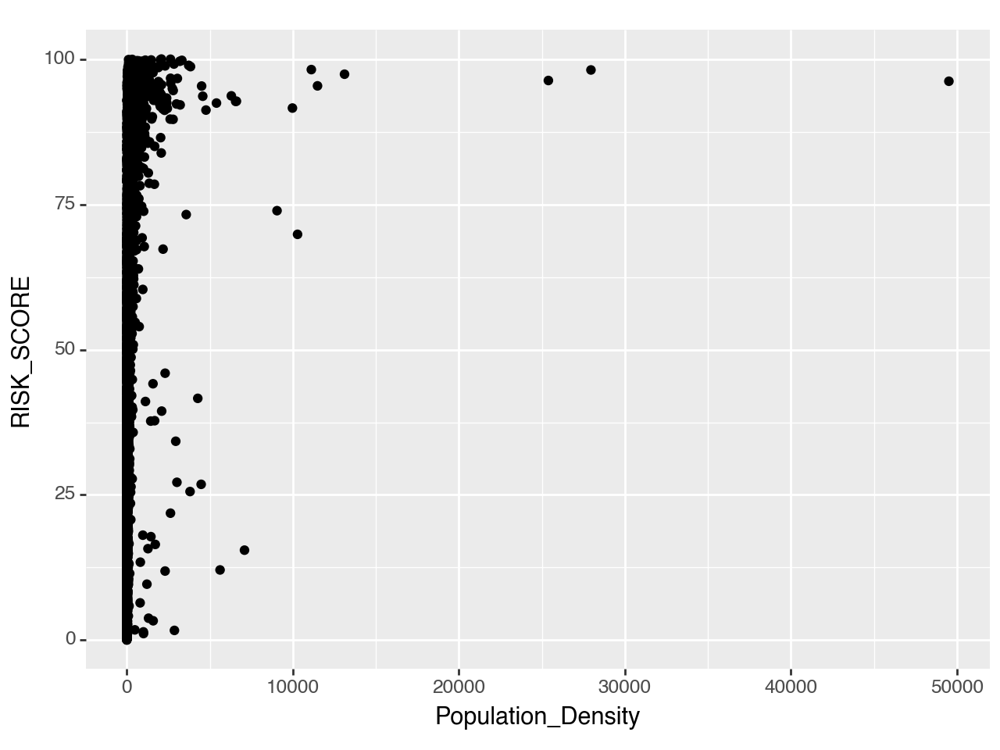

In [81]:
plot20 = (ggplot(Merged_County_Data_clean) 
 + aes(x= "Population_Density", y= "RISK_SCORE") 
 + geom_point())

print(plot20)

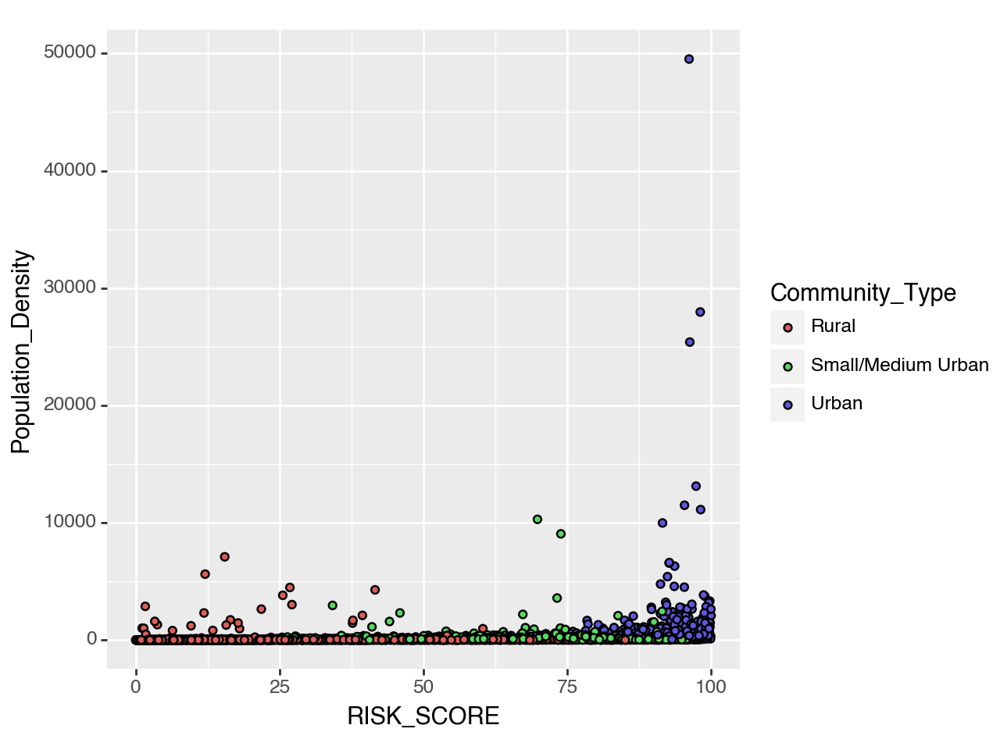

In [82]:
plot21 = (ggplot(Merged_County_Data_clean) 
 + aes(y= "Population_Density", x='RISK_SCORE', fill = "Community_Type") 
 + geom_point())

print(plot21)

In [83]:
# maybe we can filter some urban density outliers?

In [84]:
# just to see
no_density_outliers = Merged_County_Data_clean[Merged_County_Data_clean['Population_Density'] < 20000]

/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 3 rows containing missing values.


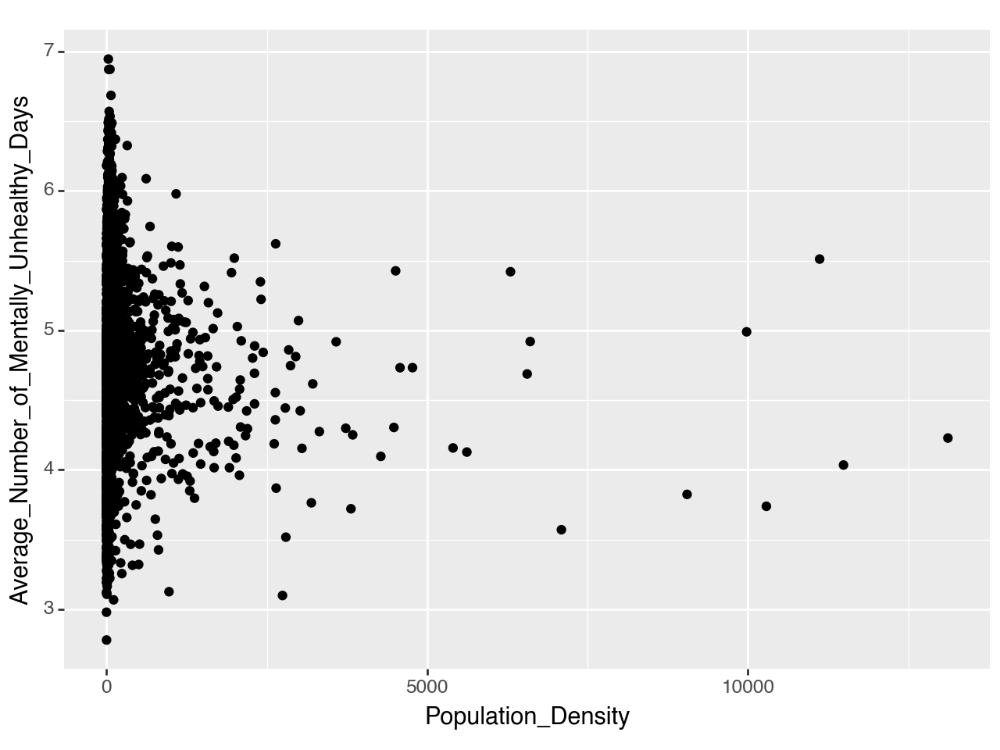

In [85]:
plot22 = (ggplot(no_density_outliers) 
 + aes(x= "Population_Density", y="Average_Number_of_Mentally_Unhealthy_Days") 
 + geom_point())

print(plot22)

/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 62 rows containing missing values.


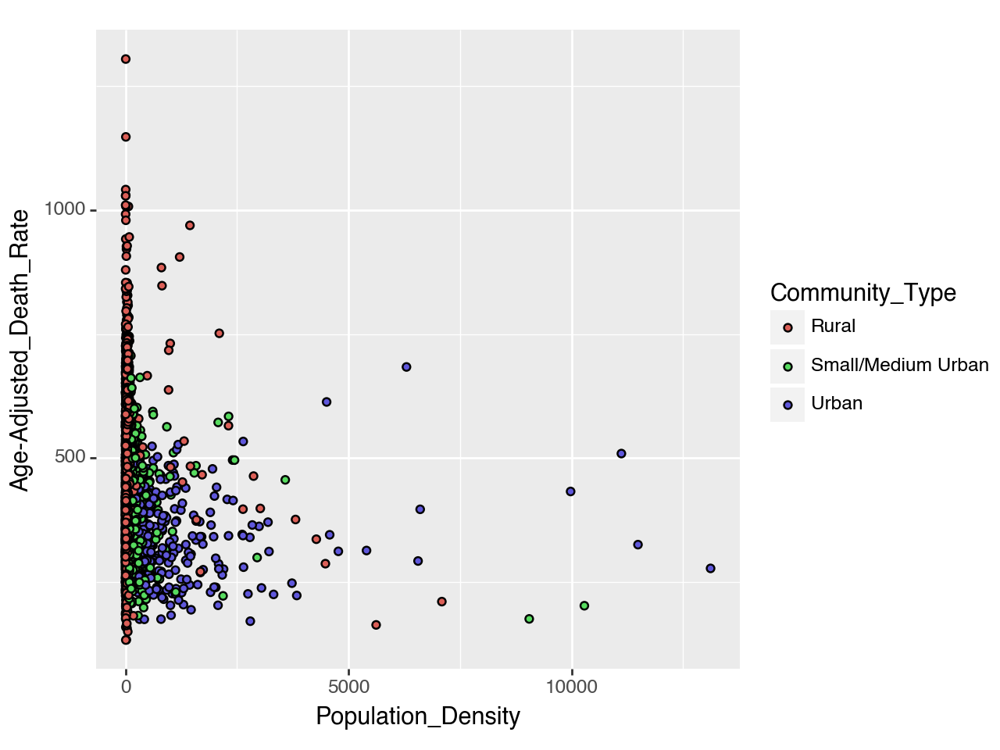

In [86]:
# without outliers

plot23 = (ggplot(no_density_outliers) 
 + aes(x= "Population_Density", y='Age-Adjusted_Death_Rate', fill = "Community_Type") 
 + geom_point())

print(plot23)

/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 62 rows containing missing values.


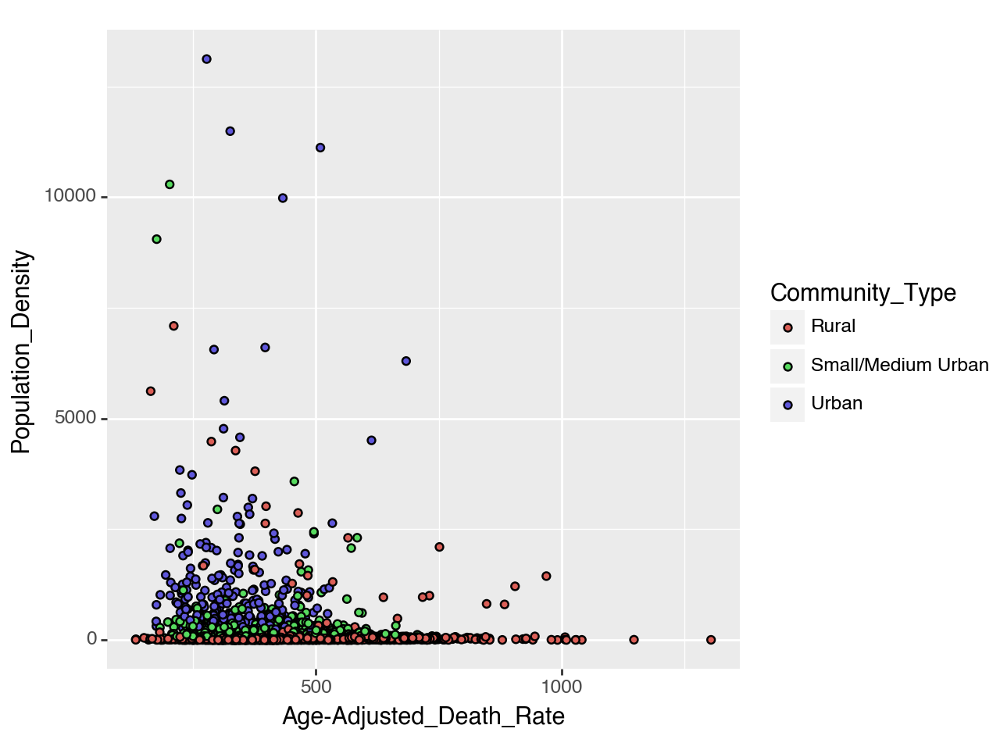

<Figure Size: (640 x 480)>

In [87]:
(ggplot(no_density_outliers) 
 + aes(y= "Population_Density", x='Age-Adjusted_Death_Rate', fill = "Community_Type") 
 + geom_point())

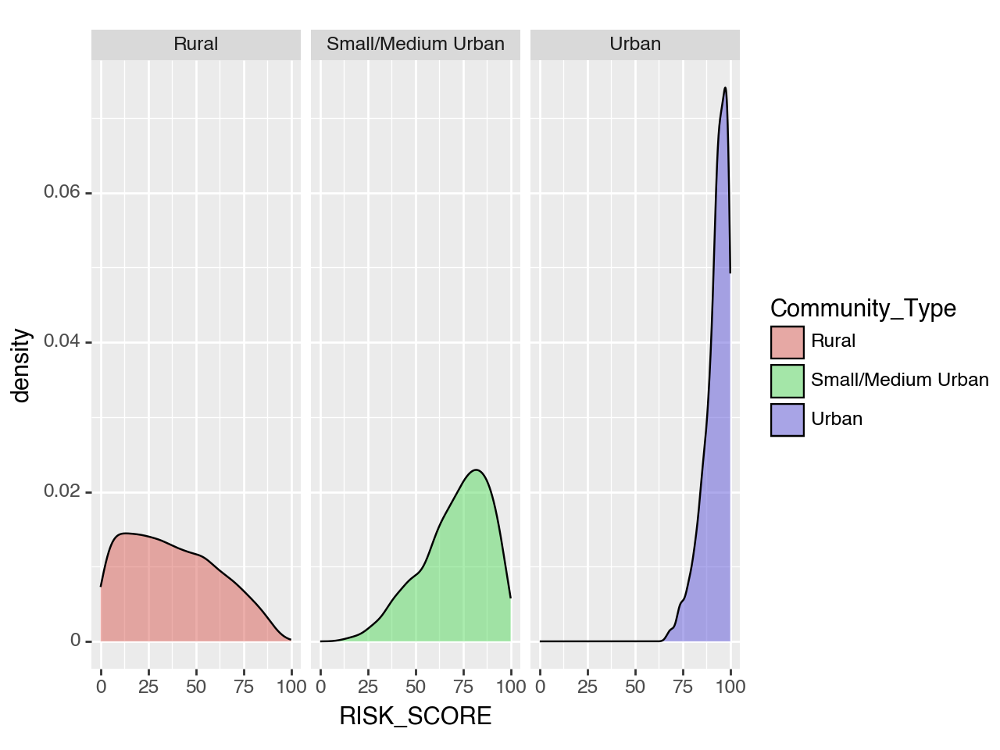

<Figure Size: (640 x 480)>

In [88]:
(ggplot(Merged_County_Data_clean, aes(x = 'RISK_SCORE', fill="Community_Type")) +
  geom_density(color="black",alpha=.5)+
  xlim(0,100) +
  facet_grid(" ~ Community_Type"))

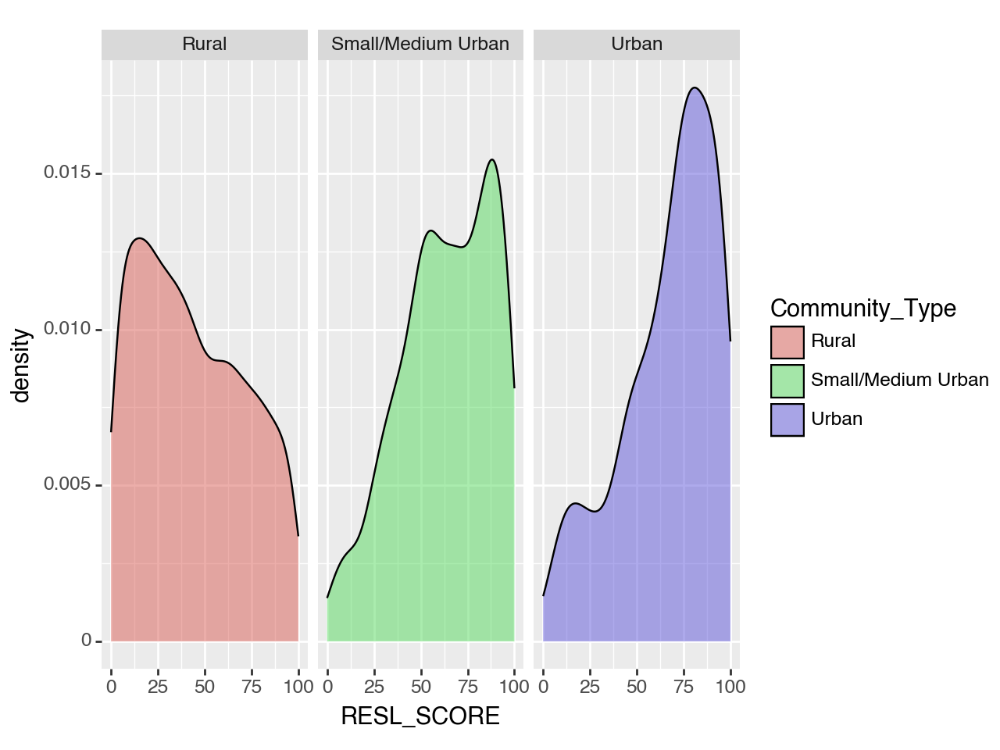

<Figure Size: (640 x 480)>

In [111]:
(ggplot(Merged_County_Data_clean, aes(x = 'RESL_SCORE', fill="Community_Type")) +
  geom_density(color="black",alpha=.5)+
  xlim(0,100) +
  facet_grid(" ~ Community_Type"))

In [89]:
Merged_County_Data_clean['Phys_Ment_Health'] = Merged_County_Data_clean['Average_Number_of_Physically_Unhealthy_Days'] - Merged_County_Data_clean['Average_Number_of_Mentally_Unhealthy_Days']

Merged_County_Data_clean['Phys_Ment_Health']


Merged_County_Data_clean['Phys_Ment_Health'].describe()

/var/folders/zd/g468sr211nz26mz91q_cxlkr0000gn/T/ipykernel_92883/387098547.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


count    3140.000000
mean       -1.280374
std         0.410802
min        -2.788627
25%        -1.550598
50%        -1.292569
75%        -1.014496
max         0.496961
Name: Phys_Ment_Health, dtype: float64

/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 3 rows containing missing values.


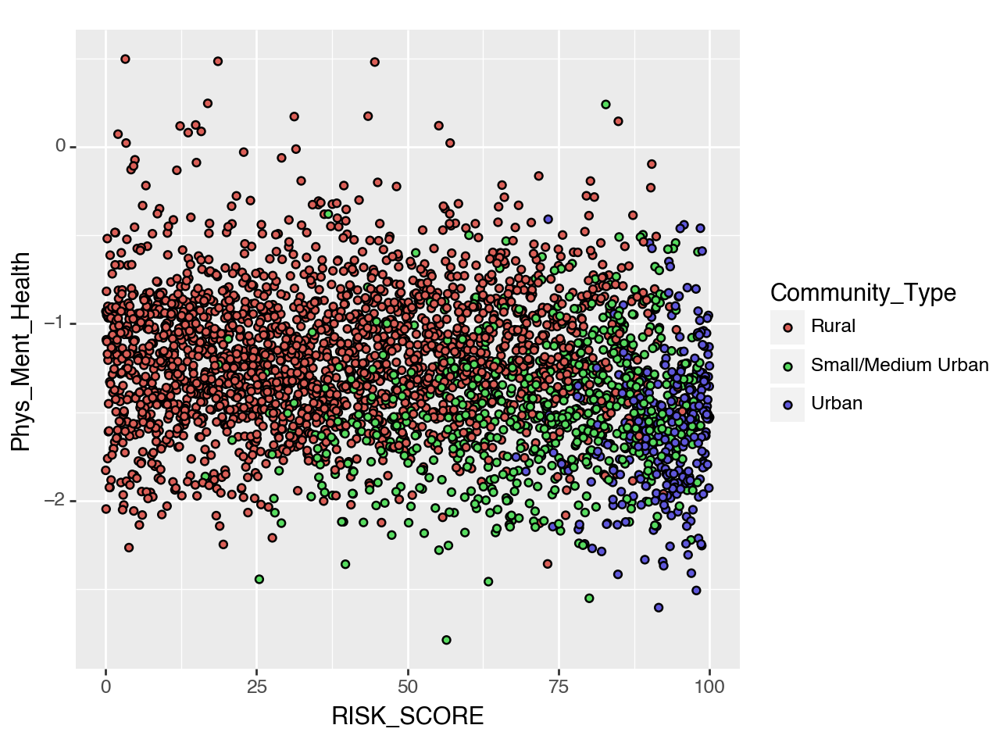

<Figure Size: (640 x 480)>

In [90]:
ggplot(Merged_County_Data_clean) + aes(y= "Phys_Ment_Health", x='RISK_SCORE', fill = "Community_Type") + geom_point()



/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_boxplot : Removed 3 rows containing non-finite values.
/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_jitter : Removed 3 rows containing missing values.


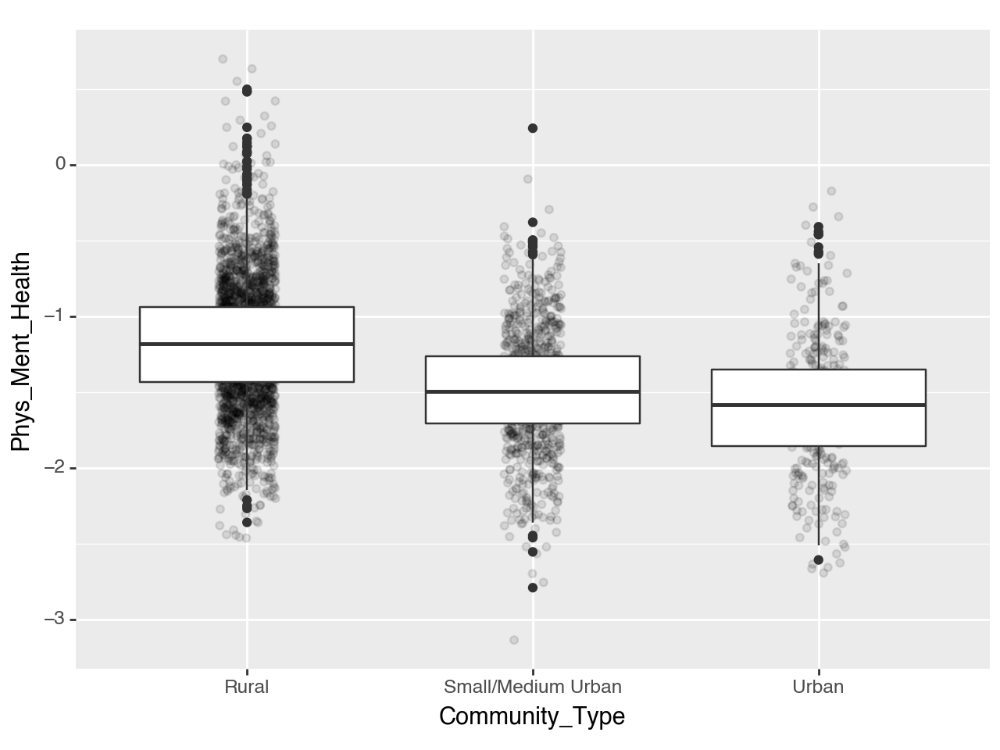

<Figure Size: (640 x 480)>

In [91]:
(ggplot(Merged_County_Data_clean) 
 + aes(y= "Phys_Ment_Health", x='Community_Type') 
 + geom_jitter(width = .1,alpha=.1,show_legend=False)
 + geom_boxplot())

/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 149 rows containing missing values.


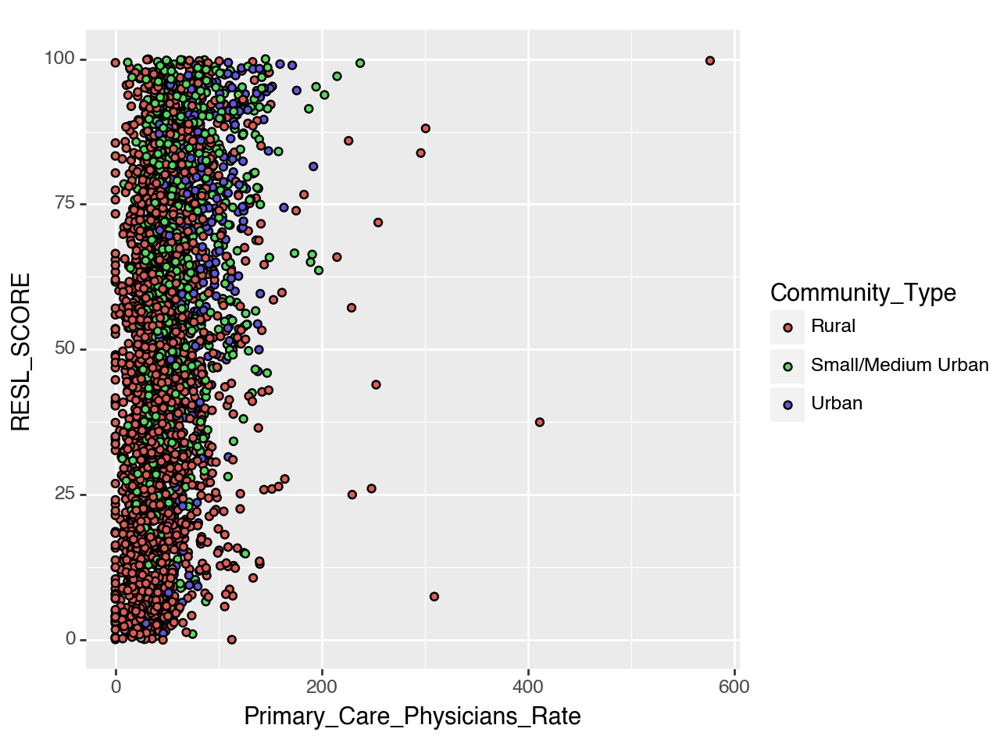

In [97]:

plot25 = (ggplot(Merged_County_Data_clean) 
 + aes(y= "RESL_SCORE", x='Primary_Care_Physicians_Rate', fill = "Community_Type") 
 + geom_point())

print(plot25)


/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 203 rows containing missing values.


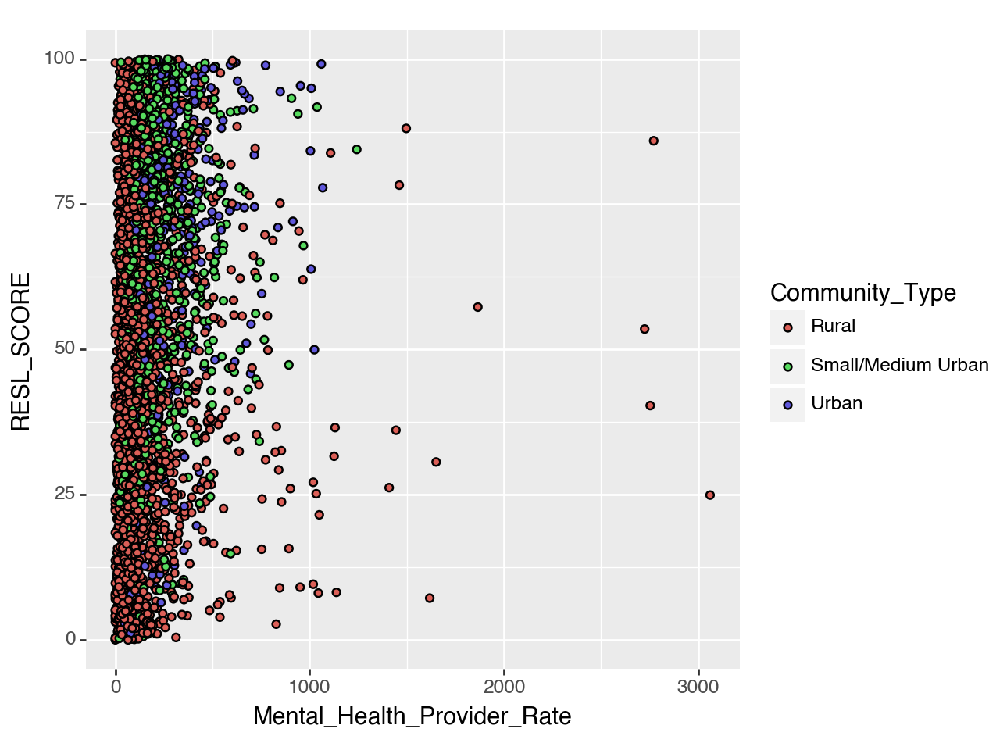

In [96]:

plot26 = (ggplot(Merged_County_Data_clean) 
 + aes(y= "RESL_SCORE", x='Mental_Health_Provider_Rate', fill = "Community_Type") 
 + geom_point())

print(plot26)


/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 149 rows containing missing values.


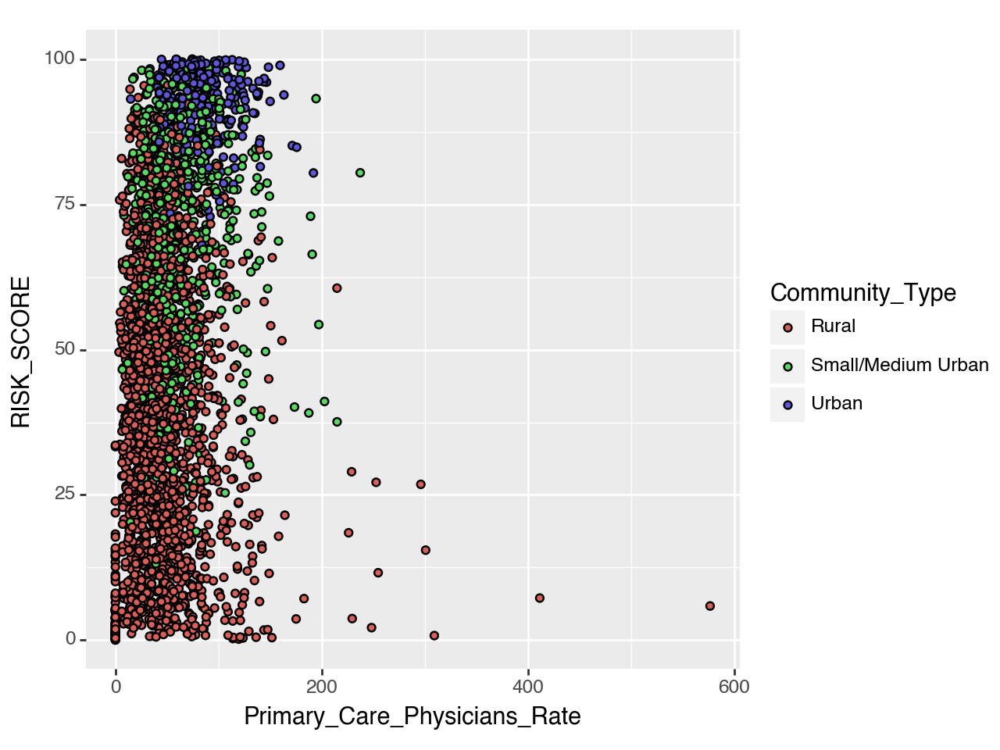

In [98]:
plot27 = (ggplot(Merged_County_Data_clean) 
 + aes(y= "RISK_SCORE", x='Primary_Care_Physicians_Rate', fill = "Community_Type") 
 + geom_point())

print(plot27)

/Users/katharynloweth/anaconda3/lib/python3.10/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 203 rows containing missing values.


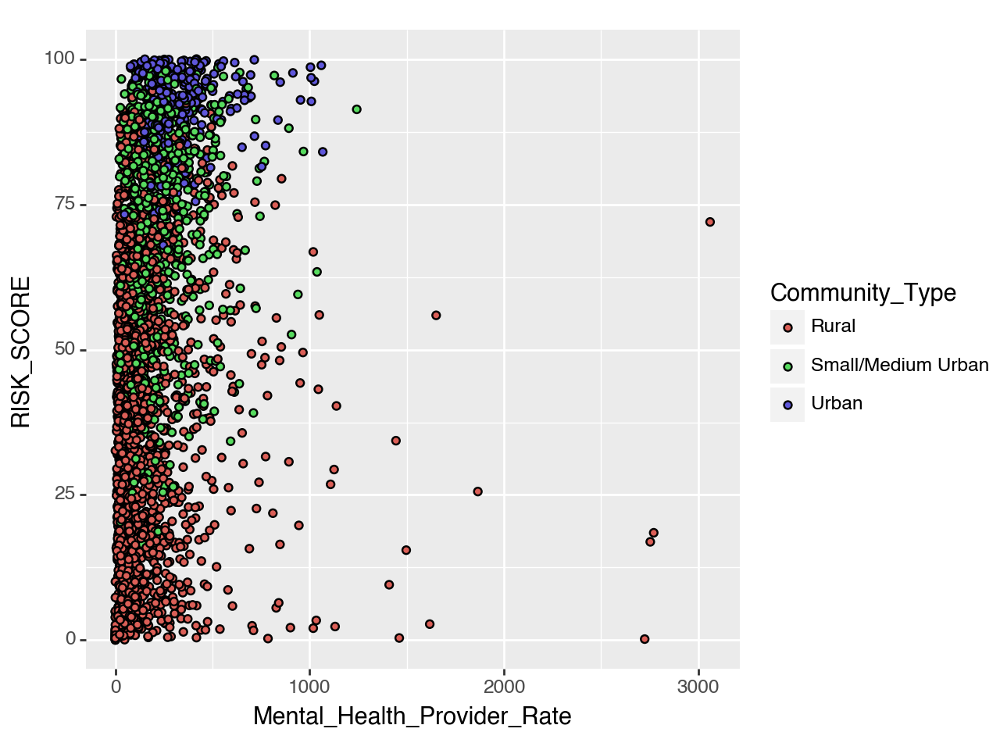

In [99]:
plot28 = (ggplot(Merged_County_Data_clean) 
 + aes(y= "RISK_SCORE", x='Mental_Health_Provider_Rate', fill = "Community_Type") 
 + geom_point())

print(plot28)

In [100]:
# import library for models
import statsmodels.api as sm
import statsmodels.formula.api as smf

In [109]:
model_ols_r_bivariate = smf.ols(formula='Life_Expectancy ~ RISK_SCORE', data=Merged_County_Data_clean).fit()

print(model_ols_r_bivariate.summary())



                            OLS Regression Results                            
Dep. Variable:        Life_Expectancy   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     10.01
Date:                Thu, 16 Nov 2023   Prob (F-statistic):            0.00157
Time:                        15:12:57   Log-Likelihood:                -7986.7
No. Observations:                3071   AIC:                         1.598e+04
Df Residuals:                    3069   BIC:                         1.599e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     76.5603      0.121    632.298      0.0

In [110]:
model_ols_r_mv1 = smf.ols(formula='Life_Expectancy ~ RISK_SCORE + Population_Density', data=Merged_County_Data_clean).fit()


print(model_ols_r_mv1.summary())

                            OLS Regression Results                            
Dep. Variable:        Life_Expectancy   R-squared:                       0.012
Model:                            OLS   Adj. R-squared:                  0.012
Method:                 Least Squares   F-statistic:                     19.41
Date:                Thu, 16 Nov 2023   Prob (F-statistic):           4.20e-09
Time:                        15:13:50   Log-Likelihood:                -7972.4
No. Observations:                3071   AIC:                         1.595e+04
Df Residuals:                    3068   BIC:                         1.597e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept             76.6016      0

In [111]:
model_ols_r_mv2 = smf.ols(formula='Life_Expectancy ~ RISK_SCORE + Population_Density + Community_Type', data=Merged_County_Data_clean).fit()


print(model_ols_r_mv2.summary())

                            OLS Regression Results                            
Dep. Variable:        Life_Expectancy   R-squared:                       0.073
Model:                            OLS   Adj. R-squared:                  0.071
Method:                 Least Squares   F-statistic:                     60.02
Date:                Thu, 16 Nov 2023   Prob (F-statistic):           7.16e-49
Time:                        15:14:42   Log-Likelihood:                -7875.9
No. Observations:                3071   AIC:                         1.576e+04
Df Residuals:                    3066   BIC:                         1.579e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


In [112]:
#comparing population vs population_density in model
model_ols_r_mv3 = smf.ols(formula='Life_Expectancy ~ RISK_SCORE + Population + Community_Type', data=Merged_County_Data_clean).fit()


print(model_ols_r_mv3.summary())

                            OLS Regression Results                            
Dep. Variable:        Life_Expectancy   R-squared:                       0.074
Model:                            OLS   Adj. R-squared:                  0.072
Method:                 Least Squares   F-statistic:                     60.92
Date:                Thu, 16 Nov 2023   Prob (F-statistic):           1.38e-49
Time:                        15:19:34   Log-Likelihood:                -7874.3
No. Observations:                3071   AIC:                         1.576e+04
Df Residuals:                    3066   BIC:                         1.579e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


In [ ]:
model_ols_r_mv4 = smf.ols(formula='Life_Expectancy ~ RISK_SCORE + Population_Density + Community_Type + Percent_65_and_Over', data=Merged_County_Data_clean).fit()


print(model_ols_r_mv4.summary())

In [101]:
model_ols_r_doc1 = smf.ols(formula='RISK_SCORE ~ Mental_Health_Provider_Rate + Primary_Care_Physicians_Rate', data=Merged_County_Data_clean).fit()
print(model_ols_r_doc1.summary())

                            OLS Regression Results                            
Dep. Variable:             RISK_SCORE   R-squared:                       0.050
Model:                            OLS   Adj. R-squared:                  0.050
Method:                 Least Squares   F-statistic:                     75.19
Date:                Wed, 29 Nov 2023   Prob (F-statistic):           1.51e-32
Time:                        11:23:20   Log-Likelihood:                -13478.
No. Observations:                2848   AIC:                         2.696e+04
Df Residuals:                    2845   BIC:                         2.698e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Intercept       

In [103]:
model_ols_r_doc2 = smf.ols(formula='RISK_SCORE ~ Mental_Health_Provider_Rate + Primary_Care_Physicians_Rate + Community_Type', data=Merged_County_Data_clean).fit()
print(model_ols_r_doc2.summary())


                            OLS Regression Results                            
Dep. Variable:             RISK_SCORE   R-squared:                       0.434
Model:                            OLS   Adj. R-squared:                  0.433
Method:                 Least Squares   F-statistic:                     544.0
Date:                Wed, 29 Nov 2023   Prob (F-statistic):               0.00
Time:                        11:25:37   Log-Likelihood:                -12742.
No. Observations:                2848   AIC:                         2.549e+04
Df Residuals:                    2843   BIC:                         2.552e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


In [105]:
model_ols_r_doc3 = smf.ols(formula='RISK_SCORE ~ Mental_Health_Provider_Rate + Primary_Care_Physicians_Rate + Community_Type + Population_Density + Percent_65_and_Over', data=Merged_County_Data_clean).fit()
print(model_ols_r_doc3.summary())

                            OLS Regression Results                            
Dep. Variable:             RISK_SCORE   R-squared:                       0.459
Model:                            OLS   Adj. R-squared:                  0.458
Method:                 Least Squares   F-statistic:                     401.6
Date:                Wed, 29 Nov 2023   Prob (F-statistic):               0.00
Time:                        11:27:19   Log-Likelihood:                -12677.
No. Observations:                2848   AIC:                         2.537e+04
Df Residuals:                    2841   BIC:                         2.541e+04
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


In [106]:
#surprising interaction between community and ratio isn't meaningful

model_ols_r_doc_inter = smf.ols(formula='RISK_SCORE ~ Mental_Health_Provider_Rate + Primary_Care_Physicians_Rate + Community_Type + Community_Type*Mental_Health_Provider_Rate + Community_Type*Primary_Care_Physicians_Rate + Population_Density + Percent_65_and_Over', data=Merged_County_Data_clean).fit()
print(model_ols_r_doc_inter.summary())



                            OLS Regression Results                            
Dep. Variable:             RISK_SCORE   R-squared:                       0.460
Model:                            OLS   Adj. R-squared:                  0.458
Method:                 Least Squares   F-statistic:                     241.8
Date:                Wed, 29 Nov 2023   Prob (F-statistic):               0.00
Time:                        11:28:14   Log-Likelihood:                -12674.
No. Observations:                2848   AIC:                         2.537e+04
Df Residuals:                    2837   BIC:                         2.544e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                                                        coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------

In [107]:
model_ols_r_resl1 = smf.ols(formula='RESL_SCORE ~ Mental_Health_Provider_Rate + Primary_Care_Physicians_Rate', data=Merged_County_Data_clean).fit()
print(model_ols_r_resl1.summary())

                            OLS Regression Results                            
Dep. Variable:             RESL_SCORE   R-squared:                       0.114
Model:                            OLS   Adj. R-squared:                  0.113
Method:                 Least Squares   F-statistic:                     182.2
Date:                Wed, 29 Nov 2023   Prob (F-statistic):           3.48e-75
Time:                        11:30:06   Log-Likelihood:                -13419.
No. Observations:                2848   AIC:                         2.684e+04
Df Residuals:                    2845   BIC:                         2.686e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Intercept       

In [108]:
model_ols_r_resl2 = smf.ols(formula='RESL_SCORE ~ Mental_Health_Provider_Rate + Primary_Care_Physicians_Rate + Community_Type', data=Merged_County_Data_clean).fit()
print(model_ols_r_resl2.summary())

                            OLS Regression Results                            
Dep. Variable:             RESL_SCORE   R-squared:                       0.167
Model:                            OLS   Adj. R-squared:                  0.166
Method:                 Least Squares   F-statistic:                     142.4
Date:                Wed, 29 Nov 2023   Prob (F-statistic):          4.08e-111
Time:                        11:30:41   Log-Likelihood:                -13330.
No. Observations:                2848   AIC:                         2.667e+04
Df Residuals:                    2843   BIC:                         2.670e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


In [109]:
model_ols_r_resl3 = smf.ols(formula='RESL_SCORE ~ Mental_Health_Provider_Rate + Primary_Care_Physicians_Rate + Community_Type + Population_Density + Percent_65_and_Over', data=Merged_County_Data_clean).fit()
print(model_ols_r_resl3.summary())

                            OLS Regression Results                            
Dep. Variable:             RESL_SCORE   R-squared:                       0.170
Model:                            OLS   Adj. R-squared:                  0.169
Method:                 Least Squares   F-statistic:                     97.23
Date:                Wed, 29 Nov 2023   Prob (F-statistic):          1.81e-111
Time:                        11:31:17   Log-Likelihood:                -13324.
No. Observations:                2848   AIC:                         2.666e+04
Df Residuals:                    2841   BIC:                         2.670e+04
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------


In [110]:
model_ols_r_resl_inter = smf.ols(formula='RESL_SCORE ~ Mental_Health_Provider_Rate + Primary_Care_Physicians_Rate + Community_Type + Community_Type*Mental_Health_Provider_Rate + Community_Type*Primary_Care_Physicians_Rate + Population_Density + Percent_65_and_Over', data=Merged_County_Data_clean).fit()
print(model_ols_r_resl_inter.summary())

                            OLS Regression Results                            
Dep. Variable:             RESL_SCORE   R-squared:                       0.175
Model:                            OLS   Adj. R-squared:                  0.172
Method:                 Least Squares   F-statistic:                     60.13
Date:                Wed, 29 Nov 2023   Prob (F-statistic):          6.14e-111
Time:                        11:32:01   Log-Likelihood:                -13316.
No. Observations:                2848   AIC:                         2.665e+04
Df Residuals:                    2837   BIC:                         2.672e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                                                                        coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------

In [29]:
#!pip install geopandas
#!pip install contextily

     ---------------------------------------- 0.0/40.3 kB ? eta -:--:--
     -------------------------------------- 40.3/40.3 kB 940.1 kB/s eta 0:00:00
   ---------------------------------------- 0.0/125.4 kB ? eta -:--:--
   ------------------- -------------------- 61.4/125.4 kB 1.7 MB/s eta 0:00:01
   ---------------------------------------  122.9/125.4 kB 1.2 MB/s eta 0:00:01
   -------------------------------------- 125.4/125.4 kB 921.6 kB/s eta 0:00:00
   ---------------------------------------- 0.0/23.4 MB ? eta -:--:--
   ---------------------------------------- 0.1/23.4 MB 1.1 MB/s eta 0:00:22
   ---------------------------------------- 0.1/23.4 MB 1.3 MB/s eta 0:00:18
   ---------------------------------------- 0.2/23.4 MB 1.2 MB/s eta 0:00:20
   ---------------------------------------- 0.2/23.4 MB 1.2 MB/s eta 0:00:20
   ---------------------------------------- 0.3/23.4 MB 1.3 MB/s eta 0:00:19
    --------------------------------------- 0.4/23.4 MB 1.3 MB/s eta 0:00:19
    --

In [31]:
import geopandas as gpd
import os
import matplotlib.pyplot as plt
import contextily

In [ ]:
help(geopandas)

In [44]:
pwd

'C:\\Users\\bsullivan\\OneDrive - FI Consulting\\Documents\\GU\\Data Science 1'

In [ ]:
os.chdir("../")

In [43]:
os.chdir("../")

In [ ]:
os.chdir('NRI_Shapefile_Counties')

In [ ]:
shape_county = gpd.read_file('NRI_Shapefile_Counties.shp')

In [ ]:
shape_county = shape_county[~shape_county.STATE.str.contains("American Samoa|Guam|Northern Mariana Islands|Virgin Islands|Puerto Rico")]
shape_county.filter(columns = ["COUNTYFIPS", "geometry"])

In [180]:
[col for col in shape_county.columns if "SCORE" in col]

['RISK_SCORE', 'EAL_SCORE', 'SOVI_SCORE', 'RESL_SCORE']

In [168]:
shape_county.columns

Index(['NRI_ID', 'STATE', 'STATEABBRV', 'STATEFIPS', 'COUNTY', 'COUNTYTYPE',
       'COUNTYFIPS', 'STCOFIPS', 'POPULATION', 'BUILDVALUE',
       ...
       'WNTW_ALRP', 'WNTW_ALRA', 'WNTW_ALR_N', 'WNTW_RISKV', 'WNTW_RISKS',
       'WNTW_RISKR', 'NRI_VER', 'Shape_Leng', 'Shape_Area', 'geometry'],
      dtype='object', length=467)

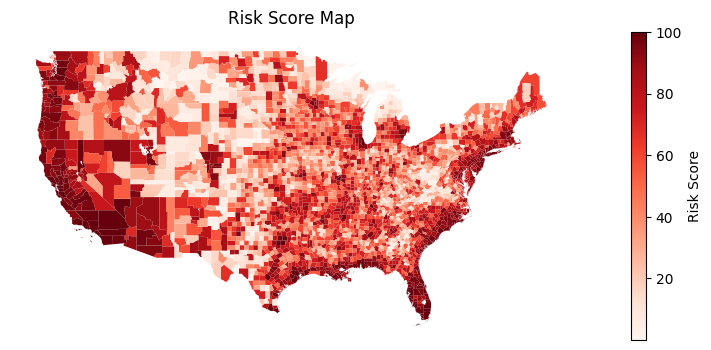

In [162]:
#Is one of these easier to comprehend than the other color-wise?

fig, ax = plt.subplots(figsize=(15,4))

gis_1 = shape_county[~shape_county.STATE.str.contains("Alaska|Hawaii")].plot(column = 'RISK_SCORE',
                                                                    cmap = 'Reds',
                                                                    legend = True, legend_kwds = {'label': "Risk Score"},
                                                                       ax=ax)

gis_1.set_axis_off()
gis_1.set_title('Risk Score Map')

plt.show()

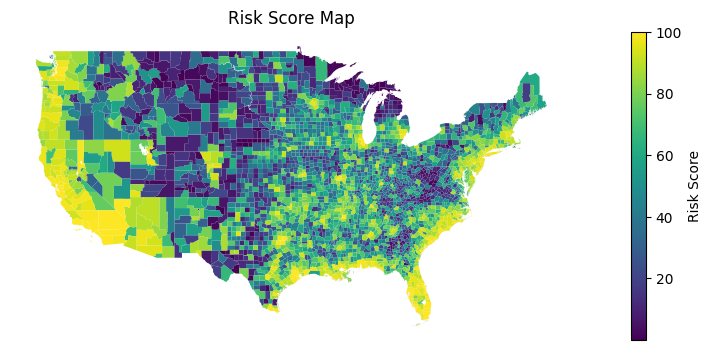

In [165]:
fig, ax = plt.subplots(figsize=(15,4))

gis_2 = shape_county[~shape_county.STATE.str.contains("Alaska|Hawaii")].plot(column = 'RISK_SCORE',
                                                                    
                                                                    legend = True, legend_kwds = {'label': "Risk Score"},
                                                                       ax=ax)

gis_2.set_axis_off()
gis_2.set_title('Risk Score Map')

plt.show()

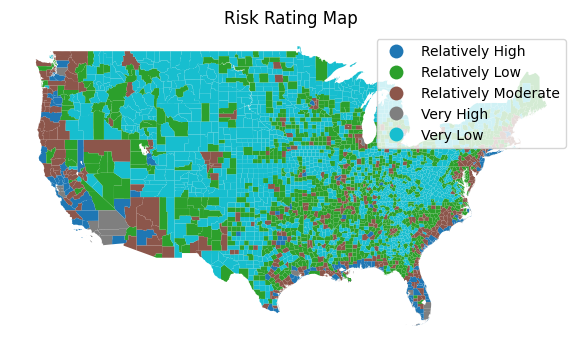

In [179]:
fig, ax = plt.subplots(figsize=(15,4))

gis_3 = shape_county[~shape_county.STATE.str.contains("Alaska|Hawaii")].plot(column = 'RISK_RATNG',
                                                                    
                                                                    legend = True, 
                                                                       ax=ax)

gis_3.set_axis_off()
gis_3.set_title('Risk Rating Map')

plt.show()

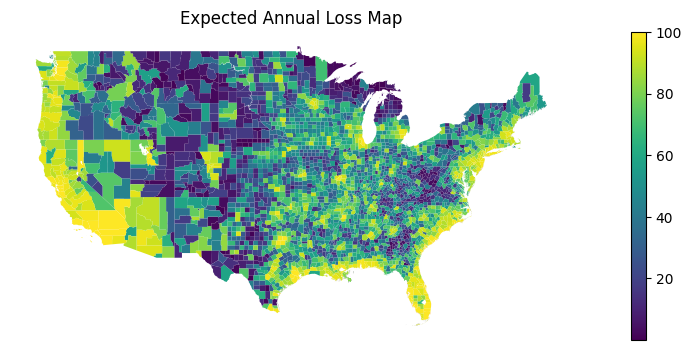

In [184]:
fig, ax = plt.subplots(figsize=(15,4))

gis_3 = shape_county[~shape_county.STATE.str.contains("Alaska|Hawaii")].plot(column = 'EAL_SCORE',
                                                                    
                                                                    legend = True, 
                                                                       ax=ax)

gis_3.set_axis_off()
gis_3.set_title('Expected Annual Loss Map')

plt.show()

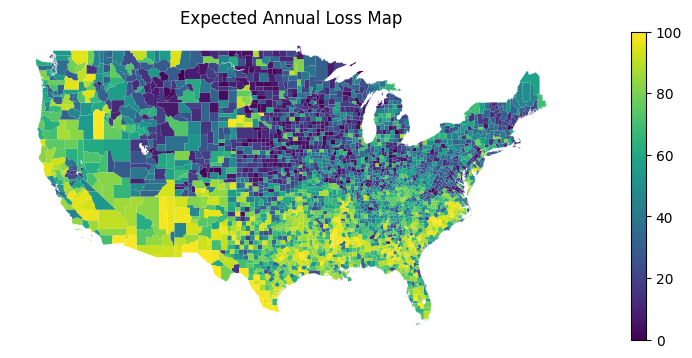

In [183]:
fig, ax = plt.subplots(figsize=(15,4))

gis_3 = shape_county[~shape_county.STATE.str.contains("Alaska|Hawaii")].plot(column = 'SOVI_SCORE',
                                                                    
                                                                    legend = True, 
                                                                       ax=ax)

gis_3.set_axis_off()
gis_3.set_title('Expected Annual Loss Map')

plt.show()

<Axes: >